In [1]:
#This file visualizes and evaluates the fitted model:
#1) Loads the .nc files
#2) Simulates model predictions
#3) Plots them against the actual data to see how well the model fits

## 1. Load data and compute cross-correlations for each modality

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from lqg import xcorr

df = pd.read_csv("data/df_all_downsampled.csv")
df.head()


,participant,phase,trial_number,type,vis_noise,time,lefty_pos,righty_pos,cursory_pos
0,135033060,pre_cal,7,vis,1,8.338,19.896919,17.680711,17.788407
1,135033060,pre_cal,7,vis,1,8.413,18.744622,17.681910,18.777561
2,135033060,pre_cal,7,vis,1,8.488,17.607245,17.680198,21.530017
3,135033060,pre_cal,7,vis,1,8.563,16.523169,17.680769,21.386902
4,135033060,pre_cal,7,vis,1,8.638,15.932538,17.680512,20.837665


In [3]:

df["participant"].unique()

array([135033060, 173058413, 177196795, 182095555, 212056115, 330954011,
       524048600, 544725341, 644801403, 657093471, 714671738, 741917610,
       765738475, 799755310, 802096684, 879521247, 891444214, 910949717,
       918338248])

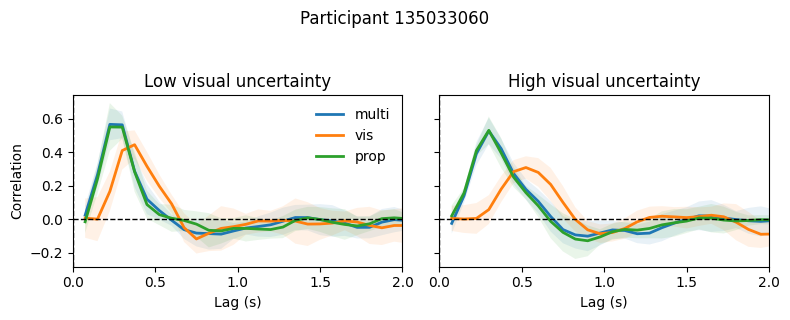

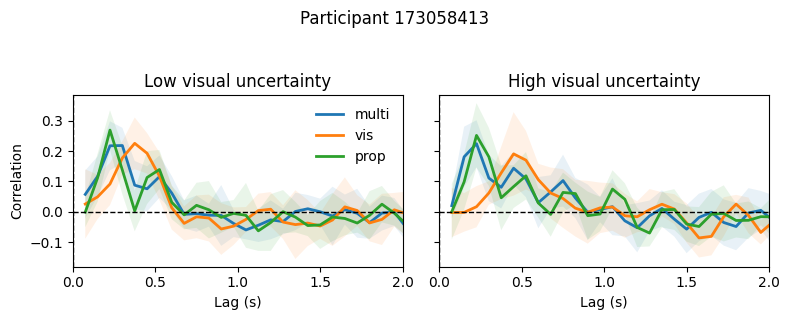

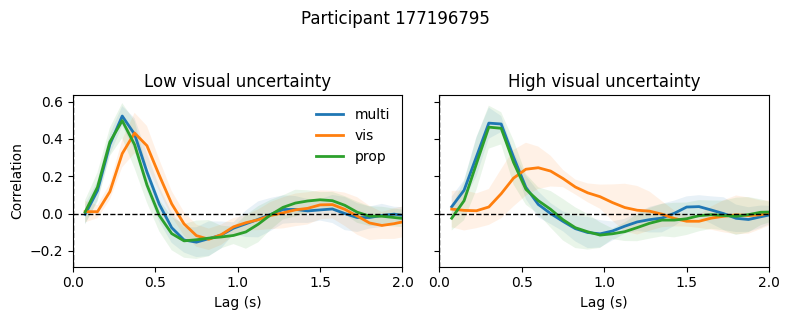

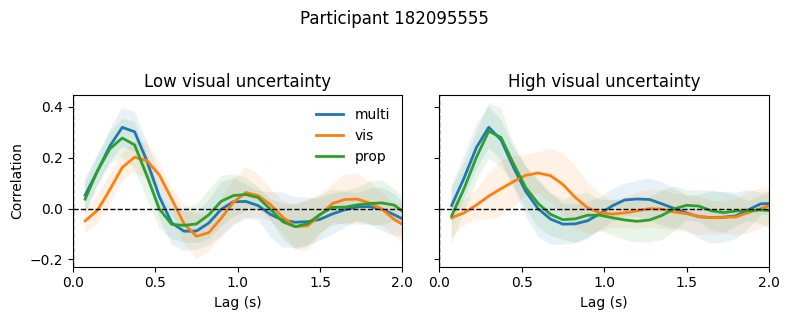

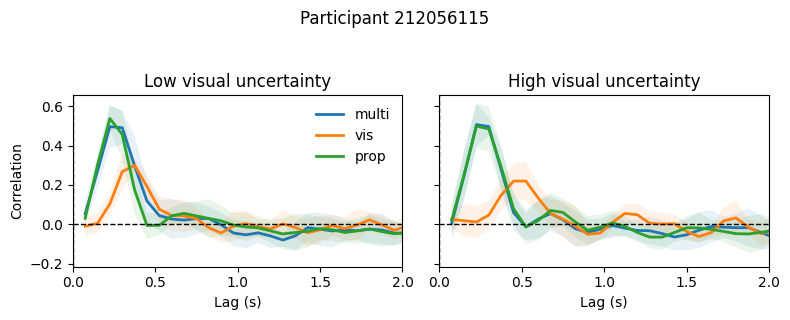

...

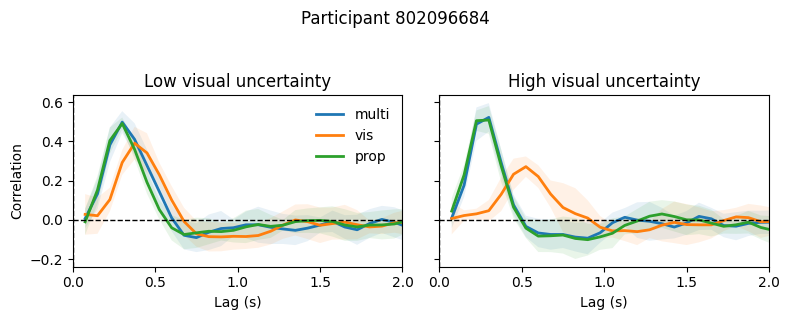

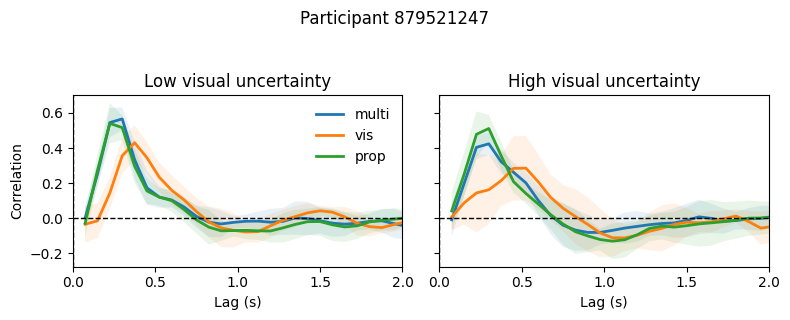

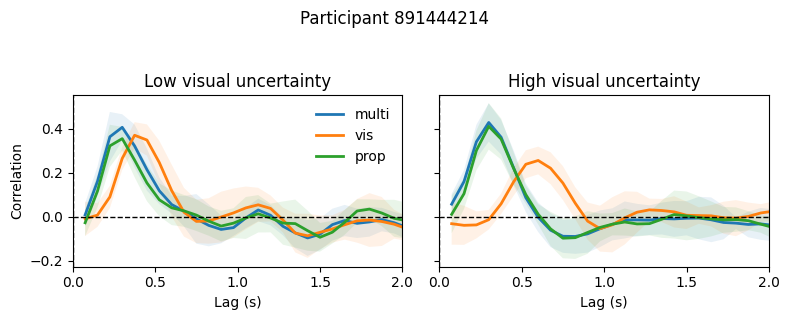

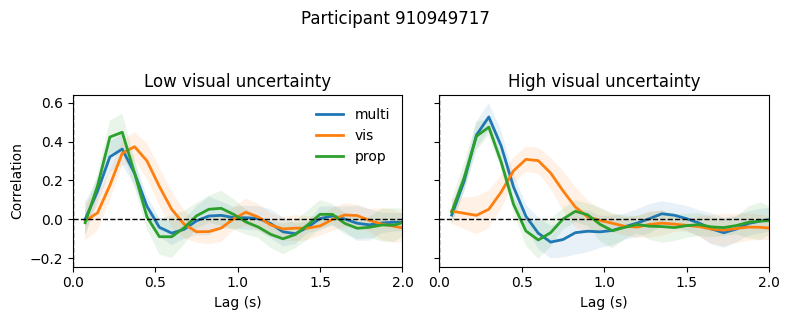

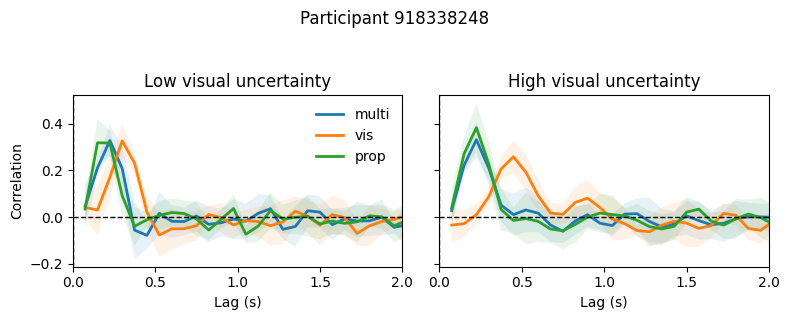

In [4]:
# for each participant, condition, vis_noise (pre_cal phase) runs prep_data function that:
#   extracts data into 3D array (trials x time points x 2 positions)
#   computes velocity of cursory and lefty
#   computes cross-correlation between cursory and lefty velocities (using fisherz transformation)

import jax.numpy as jnp

def prep_data(df, participant, condition, vis_noise, phase):
    df_sub = df[
        (df["participant"] == participant)
        & (df["type"] == condition)
        & (df["vis_noise"] == vis_noise)
        & (df["phase"] == phase)
    ]
    
    data = []
    for _, df_trial in df_sub.groupby("trial_number"):
        data.append(
            np.array([df_trial["cursory_pos"], df_trial["lefty_pos"]]).T
        )

    lens = [d.shape[0] for d in data]
    min_len = min(lens)
    data = [d[:min_len] for d in data]

    return np.stack(data)  # (trials × time × 2)

dt = 0.075
lag_slice = slice(51, None)
condition_order = ["multi", "vis", "prop"]
vis_noise_labels = {
    1: "Low visual uncertainty",
    2: "High visual uncertainty"
}

for participant in df["participant"].unique():

    vis_levels = sorted(df["vis_noise"].unique())
    fig, axes = plt.subplots(
        1, len(vis_levels),
        figsize=(4 * len(vis_levels), 3),
        sharey=True
    )

    if len(vis_levels) == 1:
        axes = [axes]

    for ax, vis_noise in zip(axes, vis_levels):

        for condition in condition_order:

            data = prep_data(
                df,
                participant=participant,
                condition=condition,
                vis_noise=vis_noise,
                phase="pre_cal"
            )

            vels = np.diff(data, axis=1)

            lags, correls = xcorr(
                vels[:, :, 1],
                vels[:, :, 0],
                maxlags=50
            )

            z_corrs = jnp.arctanh(jnp.clip(correls, -0.9999, 0.9999))
            z_mean = z_corrs.mean(axis=0)
            z_std = z_corrs.std(axis=0)

            mean_corr = jnp.tanh(z_mean)
            std_corr = jnp.tanh(z_std)

            x = lags[lag_slice] * dt
            y = mean_corr[lag_slice]
            ylo = (mean_corr - std_corr)[lag_slice]
            yhi = (mean_corr + std_corr)[lag_slice]

            ax.plot(x, y, label=condition, lw=2)
            ax.fill_between(x, ylo, yhi, alpha=0.1)

        ax.axvline(0, color='k', ls='--', lw=1)
        ax.axhline(0, color='k', ls='--', lw=1)
        ax.set_title(vis_noise_labels[vis_noise])
        ax.set_xlabel("Lag (s)")
        ax.set_xlim(0,2)

    axes[0].set_ylabel("Correlation")
    axes[0].legend(frameon=False)

    fig.suptitle(f"Participant {participant}", y=1.05)
    plt.tight_layout()
    plt.show()


In [5]:
data.shape
# 8 trials, 166 time points, 2 variables (cursory_pos, lefty_pos)
print(f"Number of trials: {data.shape[0]}")
print(f"Number of time points per trial: {data.shape[1]}")
print(f"Number of signals: {data.shape[2]}")
print(f"Total elements in array: {data.size}")

Number of trials: 8
Number of time points per trial: 166
Number of signals: 2
Total elements in array: 2656


## 2. Simulate unisensory correlations & compare to unisensory data
Load saved model files (from fit_multisensory.py) 

In [6]:
import arviz as az

In [7]:
from multisensory import UnisensoryDelayModel
from jax import random

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data
Data variables:
    action_cost         (chain, draw) float32 16kB ...
    action_variability  (chain, draw) float32 16kB ...
    sigma               (chain, draw) float32 16kB ...
                     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
action_cost         0.034  0.002   0.030    0.038      0.000    0.000   
action_variability  0.260  0.009   0.243    0.278      0.000    0.000   
sigma               9.748  0.590   8.702   10.907      0.011    0.009   

                    ess_bulk  ess_tail  r_hat  
action_cost           3260.0    2843.0    1.0  
action_variability    3343.0    3174.0    1.0  
sigma                 3193.0    2668.0    1.0  
Posterior mean values:
action_cost: 0.034
action_variability: 0.26
sigma: 9.748


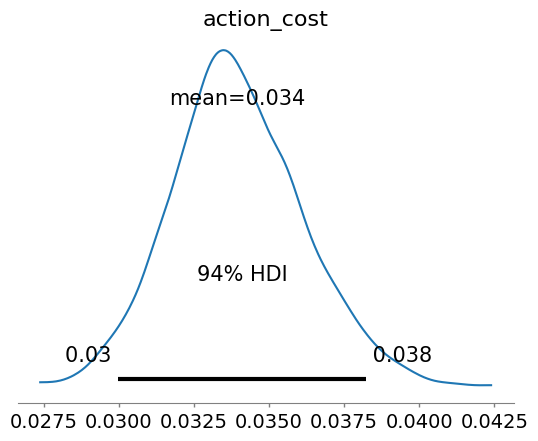

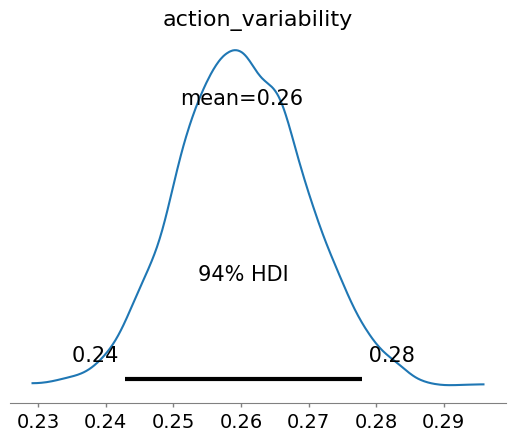

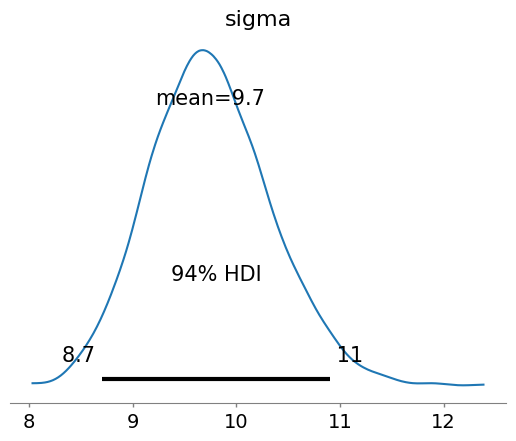

In [8]:
#### Explore what is in each model output .nc file
# Example file
file_path = "results/nc/multisensory-mcmc-vis-1-UnisensoryDelayModel-participant-177196795-seed-1.nc"

# Load the inference data
idata_test = az.from_netcdf(file_path)

# Look at the contents
print(idata_test)

# List all posterior parameters
print(idata_test.posterior.data_vars)
summary_test=az.summary(idata_test)
print(summary_test)

# Extract the mean values for all parameters
posterior_mean = summary_test["mean"].to_dict()
print("Posterior mean values:")
for k, v in posterior_mean.items():
    print(f"{k}: {v}")

#### visualize the posterior distributions
import matplotlib.pyplot as plt

# Plot the posterior for each parameter
for param in ["action_cost", "action_variability", "sigma"]:
    az.plot_posterior(idata_test, var_names=[param])
    plt.show()

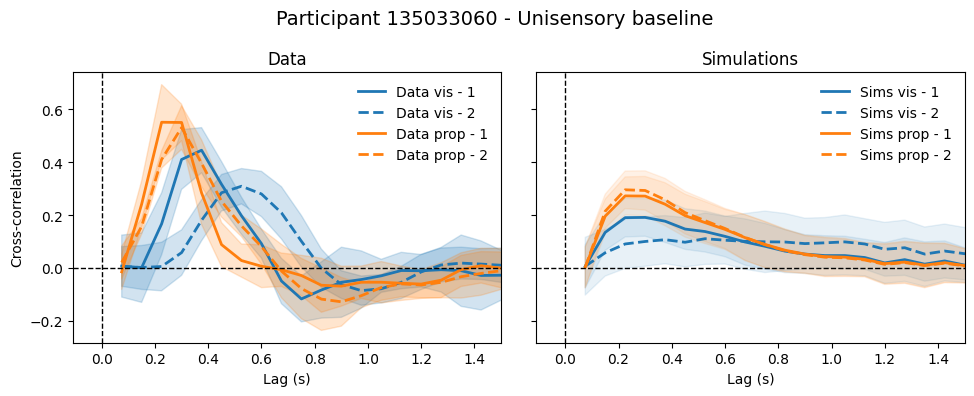

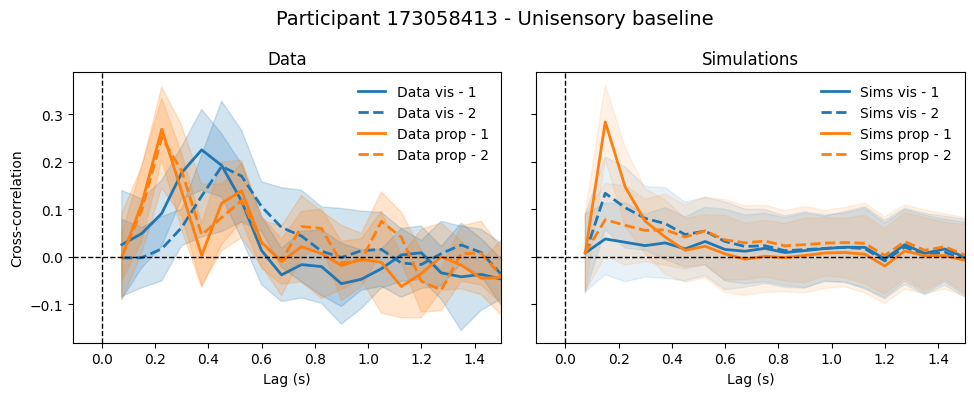

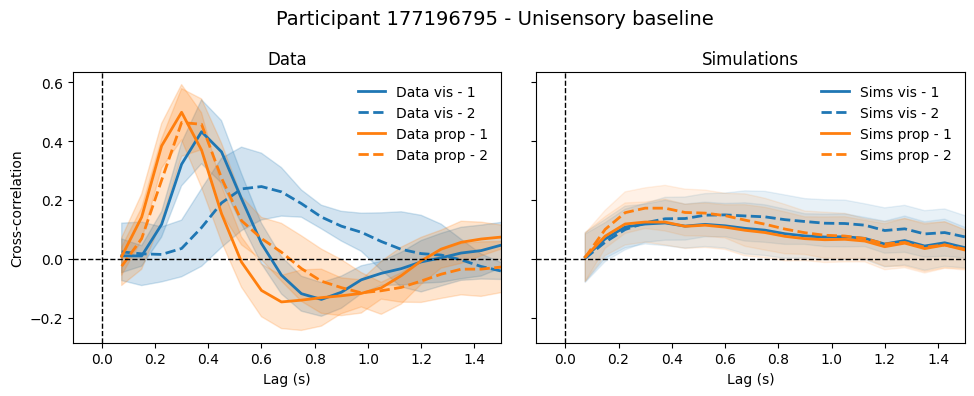

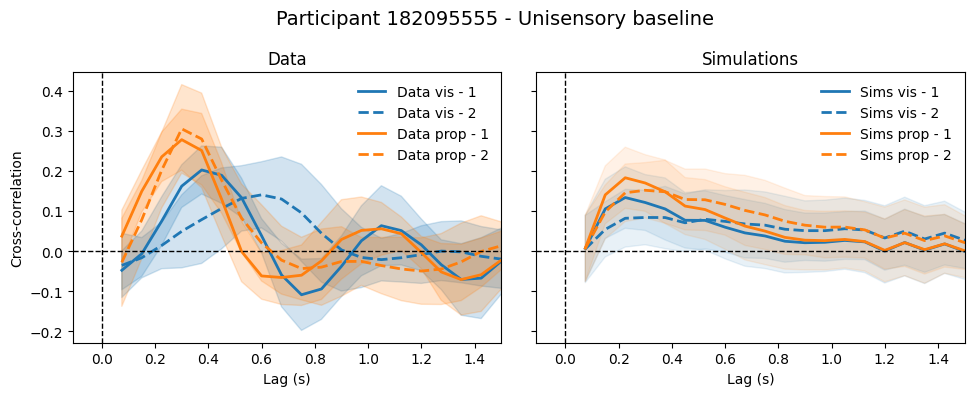

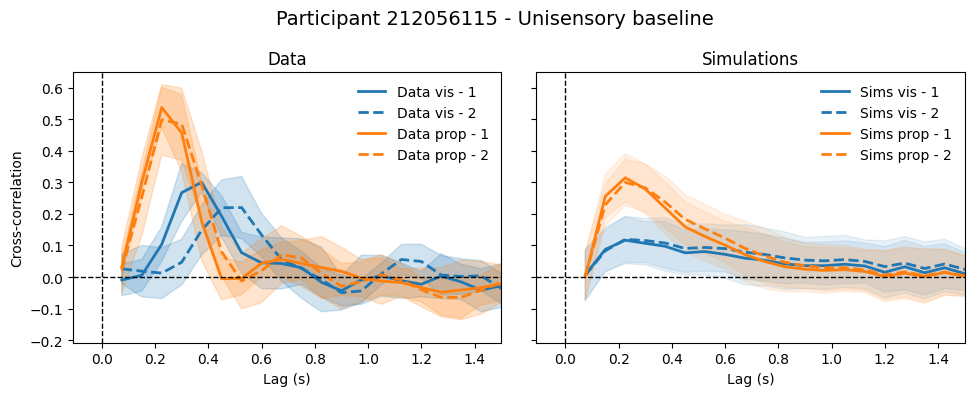

...

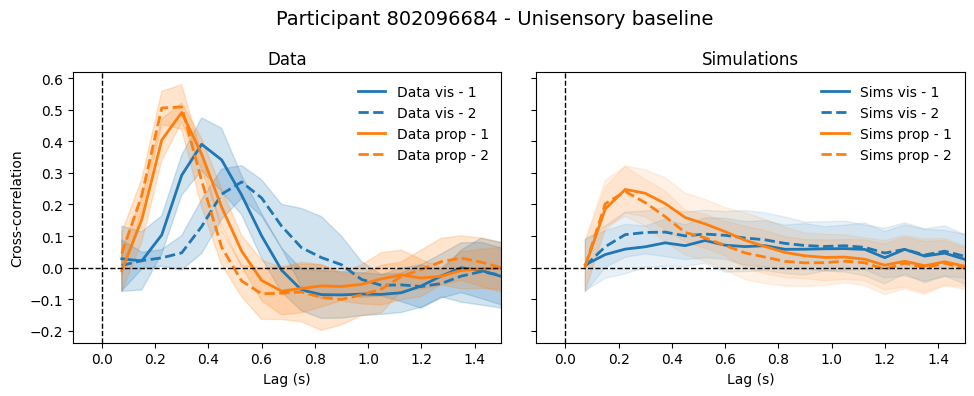

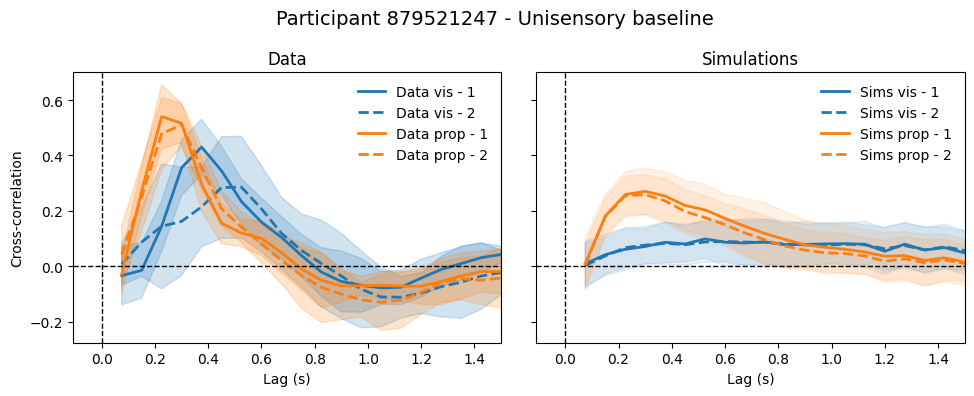

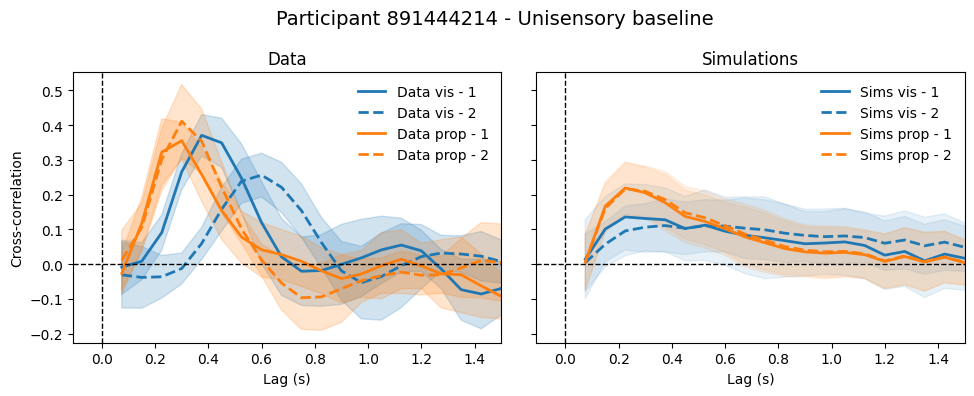

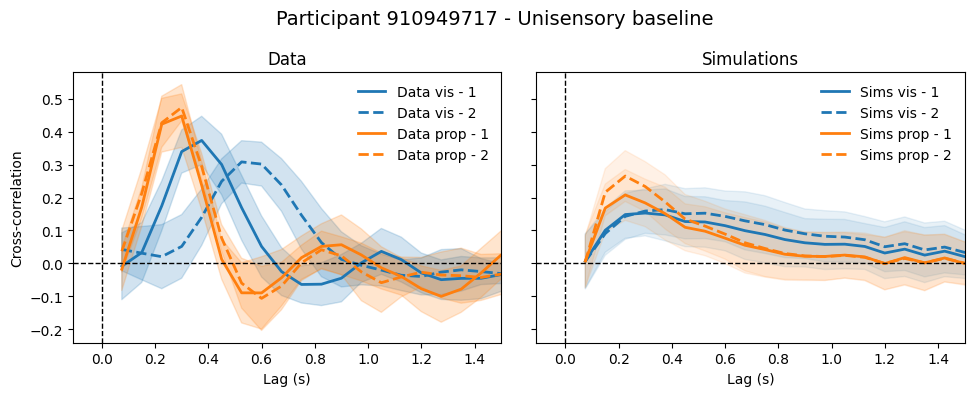

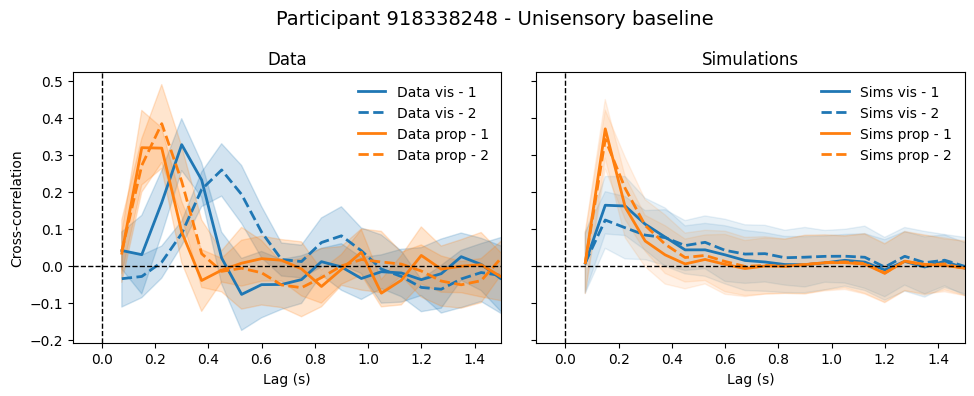

In [9]:
# Load fitted parameters from MCMC results

delays = {"vis":1, "prop": 1} # delay = time steps (vis=75 ms, prop=75ms)

for participant in df ["participant"]. unique():
        f, ax = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

        for i, condition in enumerate(["vis", "prop"]):
                for vis_noise in [1, 2]:
                        inference_data = az.from_netcdf(
                                f"results/nc/multisensory-mcmc-{condition}-{vis_noise}-UnisensoryDelayModel-participant-{participant}-seed-1.nc"
                        )
                        summary = az.summary(inference_data)

                        posterior_mean = summary["mean"].to_dict()

# Simulate model with posterior parameters
                        model = UnisensoryDelayModel(**posterior_mean, T=data.shape[1], delay=delays[condition], dt=0.075) # calls model with fitted params, T= time steps
                        sim_data = model.simulate(
                        rng_key=random.PRNGKey(0), n=100
                        )
 # compute cross-correlations for simulated data
                        sim_vels = np.diff(sim_data, axis=1)
                        lags, sim_correls = xcorr(sim_vels[:, :, 1], sim_vels[:, :, 0], maxlags=50)

# fisher-z transformation for simulated data
                        z_sim_correls = jnp.arctanh(jnp.clip(sim_correls, -0.9999, 0.9999))
                        z_sim_mean = z_sim_correls.mean(axis=0) 
                        z_sim_std = z_sim_correls.std(axis =0)
                        mean_sim = jnp.tanh(z_sim_mean)
                        std_sim= jnp.tanh(z_sim_std)

# compute cross-correlations for actual data
                        data = prep_data(df, participant=participant, condition=condition, vis_noise=vis_noise, phase="pre_cal")
                        vels = np.diff(data, axis=1)
                        lags, correls = xcorr(vels[:, :, 1], vels[:, :, 0], maxlags=50)

# fisher-z transformation for actual data
                        z_data = jnp.arctanh(jnp.clip(correls, -0.9999, 0.9999))
                        z_mean = z_data.mean(axis=0)
                        z_std = z_data.std(axis=0)
                        mean_corr = jnp.tanh(z_mean)
                        std_corr = jnp.tanh(z_std)

# --- Plot data ---
                        ax[0].plot(
                                x,
                                mean_corr[lag_slice],
                                label=f"Data {condition} - {vis_noise}",
                                linestyle="-" if vis_noise == 1 else "--",
                                color=f"C{i}",
                                lw=2
                        )
                        ax[0].fill_between(
                                x,
                                (mean_corr - std_corr)[lag_slice],
                                (mean_corr + std_corr)[lag_slice],
                                color=f"C{i}",
                                alpha=0.2
                        )

# --- Plot model ---
                        ax[1].plot(
                                x,
                                mean_sim[lag_slice],
                                label=f"Sims {condition} - {vis_noise}",
                                linestyle="-" if vis_noise == 1 else "--",
                                color=f"C{i}",
                                lw=2
                        )
                        ax[1].fill_between(
                                x,
                                (mean_sim - std_sim)[lag_slice],
                                (mean_sim + std_sim)[lag_slice],
                                color=f"C{i}",
                                alpha=0.1
                        )

# --- Figure labels and formatting ---
        f.suptitle(f"Participant {participant} - Unisensory baseline", fontsize=14)
        ax[0].set_xlabel("Lag (s)")
        ax[1].set_xlabel("Lag (s)")
        ax[0].set_ylabel("Cross-correlation")
        ax[0].set_title("Data")
        ax[1].set_title("Simulations")
        ax[0].legend(frameon=False)
        ax[1].legend(frameon=False)
        ax[0].set_xlim(right=1.5)
        ax[1].set_xlim(right=1.5)
        ax[0].axvline(0, color='k', ls='--', lw=1)
        ax[1].axvline(0, color='k', ls='--', lw=1)
        ax[0].axhline(0, color='k', ls='--', lw=1)
        ax[1].axhline(0, color='k', ls='--', lw=1)
        plt.tight_layout()
        plt.show()

## 3. Multisensory simulations

In [10]:
from jax import random, jit, numpy as jnp
from jax.scipy import linalg
#import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, IntSlider
from lqg.tracking.delay import TemporalDelayModel
from lqg.tracking.subjective import SubjectiveActor
from lqg import xcorr, LQG, System
from lqg.utils import time_stack_spec
from multisensory import multisensory_delay_system

### Simulate multisensory + unisensory data under low visual uncertainty

#### Participant-level

Processing participant: 135033060


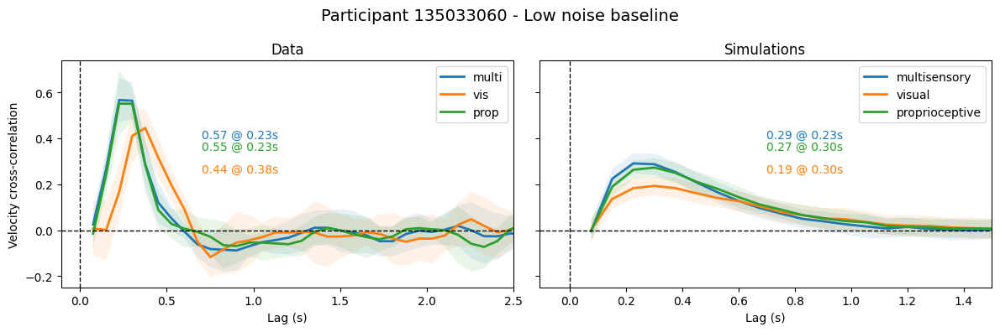

Processing participant: 173058413


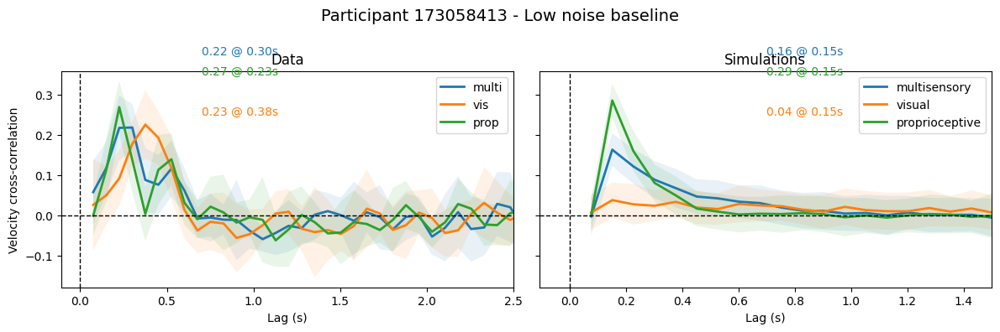

Processing participant: 177196795


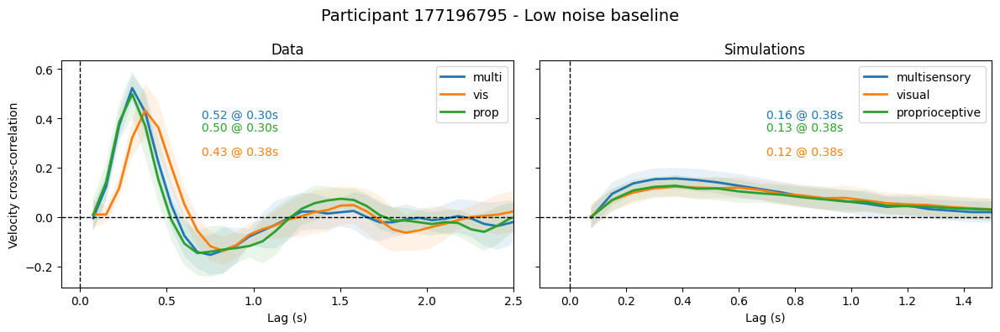

Processing participant: 182095555


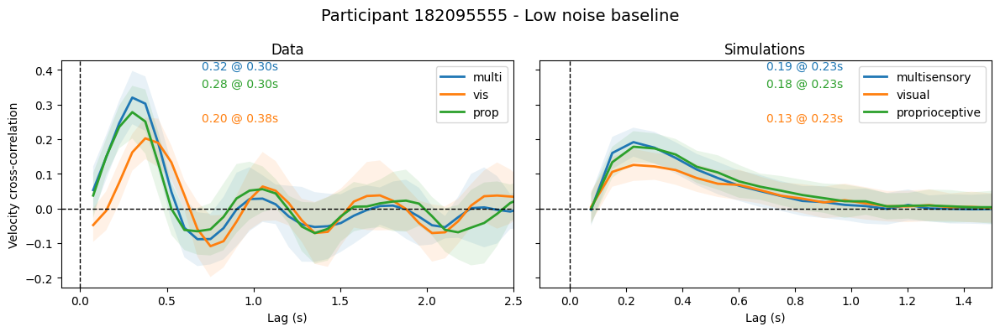

Processing participant: 212056115


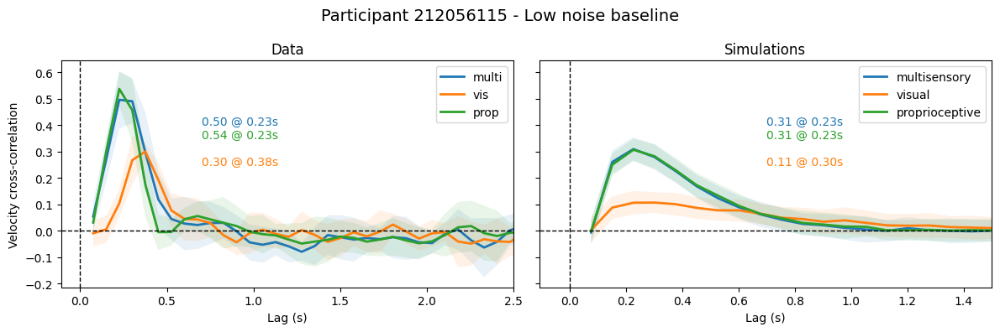

Processing participant: 330954011


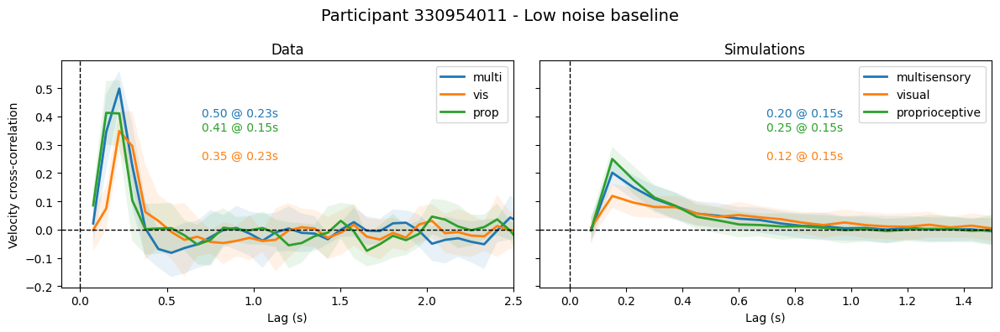

Processing participant: 524048600


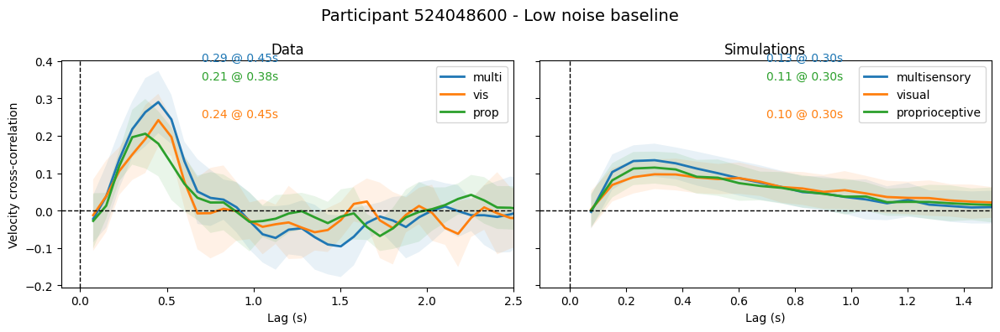

Processing participant: 544725341


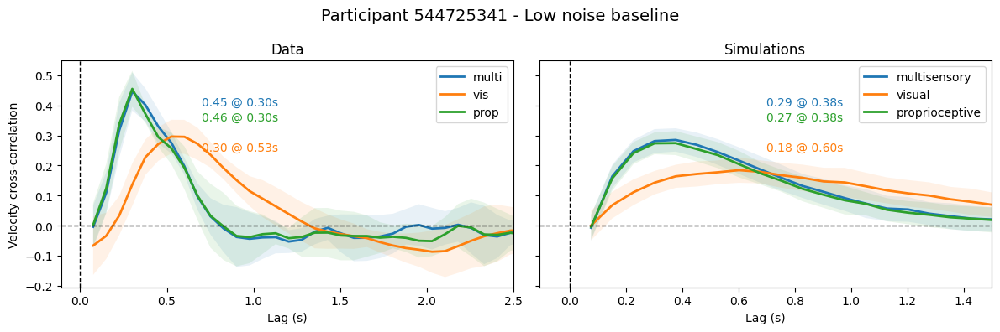

Processing participant: 644801403


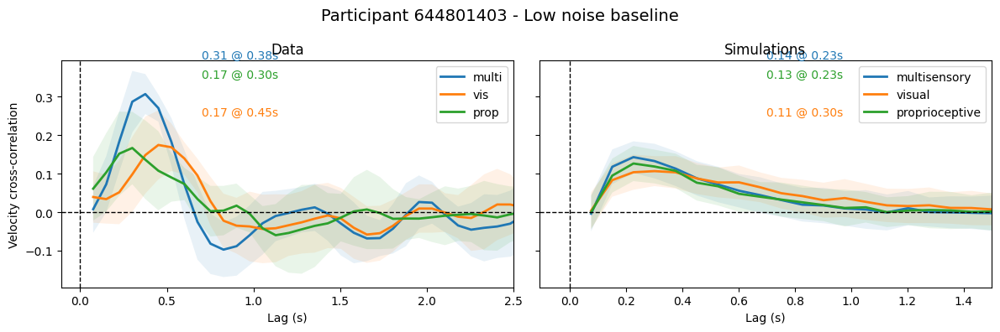

Processing participant: 657093471


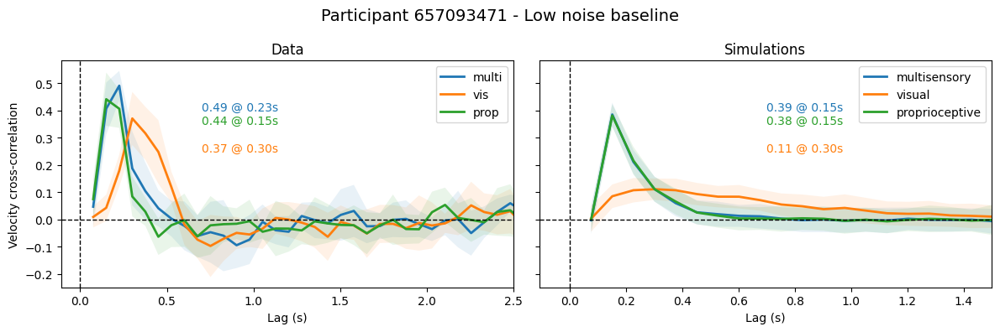

Processing participant: 714671738


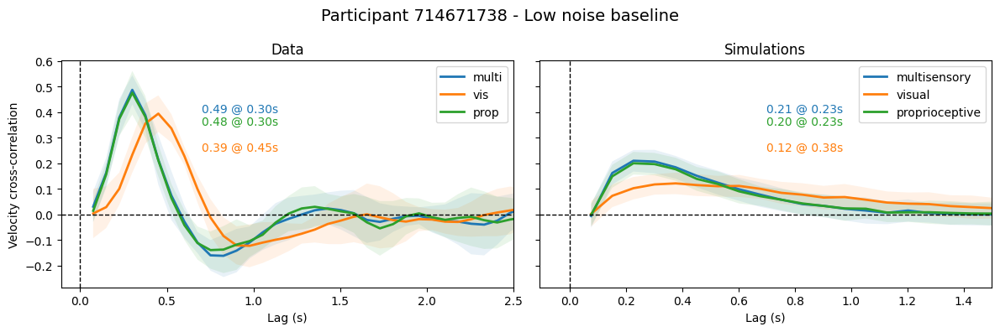

Processing participant: 741917610


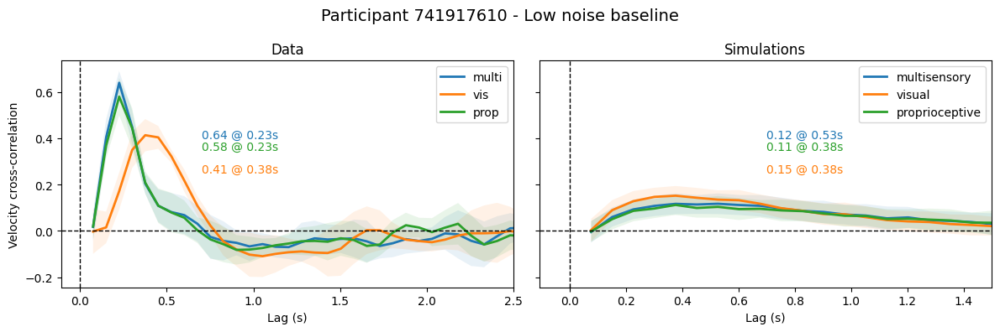

Processing participant: 765738475


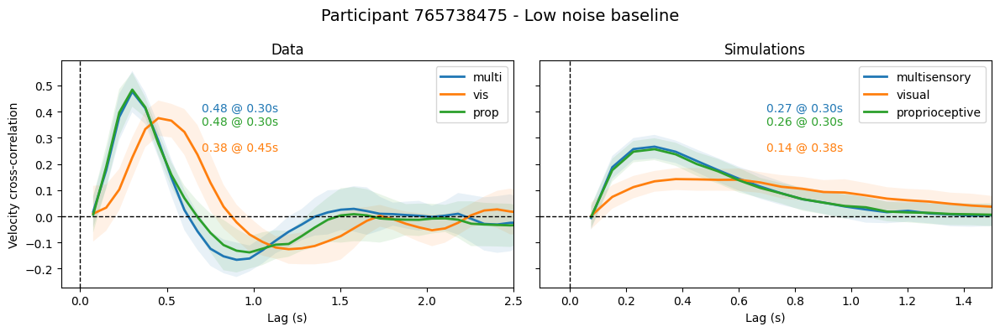

Processing participant: 799755310


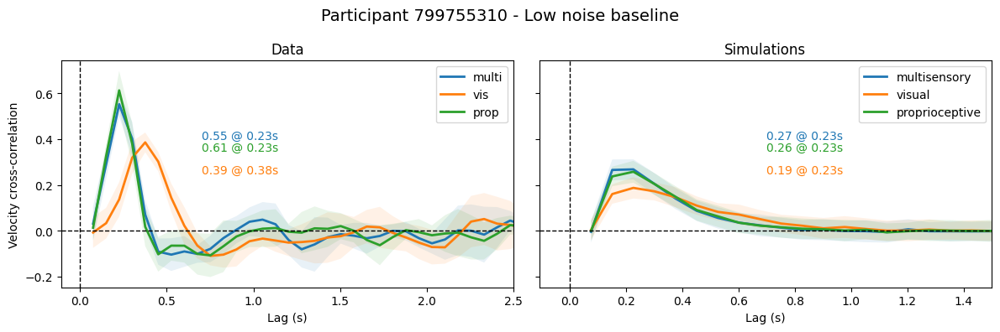

Processing participant: 802096684


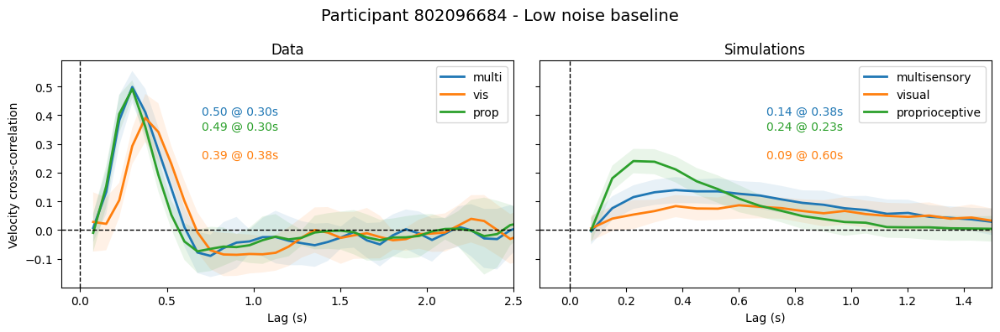

Processing participant: 879521247


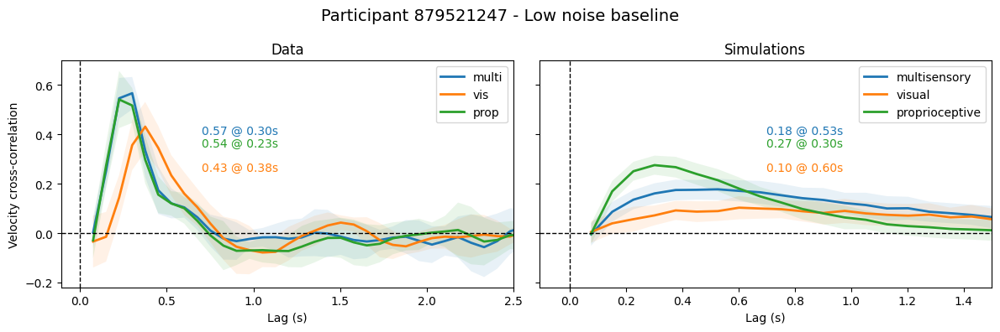

Processing participant: 891444214


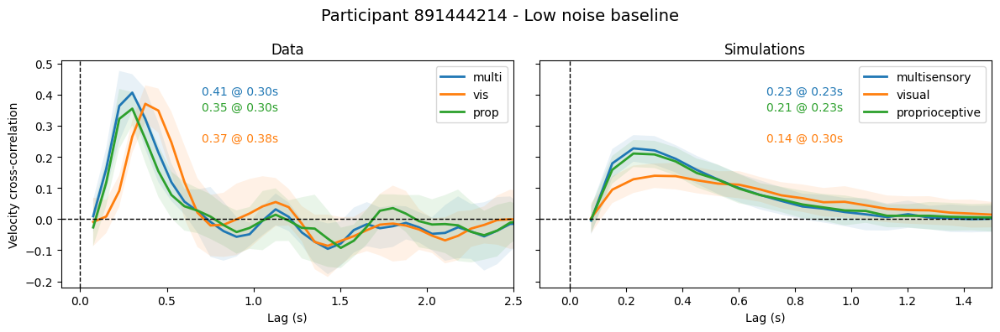

Processing participant: 910949717


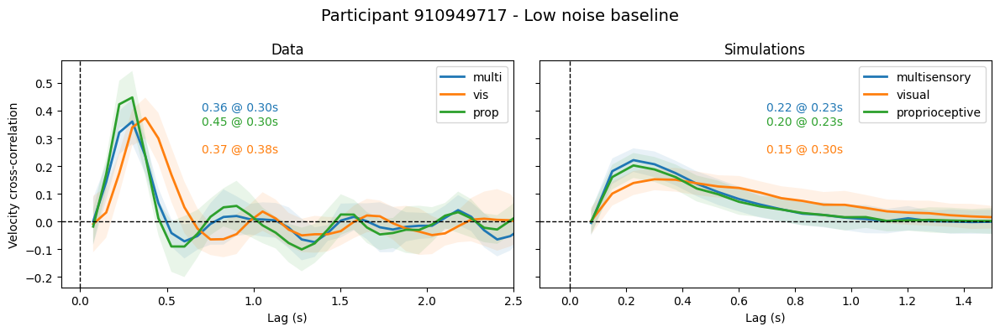

Processing participant: 918338248


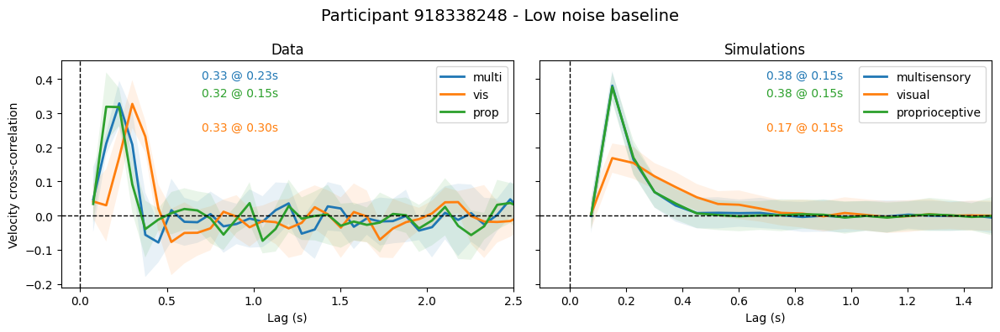

In [11]:
#extract low-noise parameters (action_cost, action_variability, sigma) for each modality + participant
# define sensory noise matrices based on sigma values
# assign sensory delays for each modality
# build system matrices with fitted params for each participant
# define 3 systems + models
# simulate trajectories for each model 
# compute velocities + cross correlograms, create figures

df_summary = pd.read_csv('/Users/pamelavillavicencio/Dropbox/Academic/phd/01_experiments/03_cont_psyphys/01_exp/03_python/01_modelling/results/summary/unisensory_baseline_summary.csv')
df_data = pd.read_csv("data/df_all_downsampled.csv")
annotation_x = 0.7 
participants = df_summary['participant_id'].unique()
dt = 1 / 13.3

# Storage for group-level averaging
participant_correls_actual_low = {cond: [] for cond in ["multi", "vis", "prop"]}
participant_correls_sim_low = {name: [] for name in ["multisensory", "visual", "proprioceptive"]}
lags_actual = None
lags_sim = None

condition_order = ["multi", "vis", "prop"]
condition_labels = {
    "multi": "multisensory",
    "vis": "visual",
    "prop": "proprioceptive"
}

for participant in participants:
    print(f"Processing participant: {participant}")
    
    # -------------------------
    # Get low-noise parameters from models
    # -------------------------
    prop_low = df_summary[(df_summary['participant_id'] == participant) & 
                          (df_summary['modality'] == 'prop') & (df_summary['vis_noise'] == 1)].iloc[0]
    vis_low = df_summary[(df_summary['participant_id'] == participant) & 
                         (df_summary['modality'] == 'vis') & (df_summary['vis_noise'] == 1)].iloc[0]
    
    action_variability_vis= ((prop_low["sigma"]**2)/ (prop_low["sigma"]**2 + vis_low["sigma"]**2)) * vis_low["action_variability"]
    action_variability_prop= ((vis_low["sigma"]**2)/ (vis_low["sigma"]**2 + prop_low["sigma"]**2)) * prop_low["action_variability"]
    action_variability= action_variability_vis + action_variability_prop 

    action_cost_vis= ((prop_low["sigma"]**2)/ (prop_low["sigma"]**2 + vis_low["sigma"]**2)) * vis_low["action_cost"]
    action_cost_prop= ((vis_low["sigma"]**2)/ (vis_low["sigma"]**2 + prop_low["sigma"]**2)) * prop_low["action_cost"]
    action_cost= action_cost_vis + action_cost_prop
    
    W_proprioceptive = jnp.diag(jnp.array([prop_low["sigma"]]))
    W_visual = jnp.diag(jnp.array([vis_low["sigma"]]))
    
    delay_proprioceptive = 1
    delay_visual = 1
    
    A = jnp.eye(2) # system dynamics
    B = dt * jnp.array([[0.0], [1.0]]) # control input
    F = jnp.array([[1., -1.]]) # observation
    #V = jnp.diag(jnp.array([1, ((prop_low["action_variability"] + vis_low["action_variability"]) / 2)])) # average action variability (process noise)
    V =jnp.diag(jnp.array([1, action_variability])) # weighted action variability
    V_vis = jnp.diag(jnp.array([1, vis_low["action_variability"]])) # visual-only action variability
    V_prop = jnp.diag(jnp.array([1, prop_low["action_variability"]])) # proprioceptive-only action variability
    Q = jnp.array([[1., -1.], [-1., 1.]]) # state cost
    #R = jnp.array([[(prop_low["action_cost"] + vis_low["action_cost"]) / 2]])   # combined action cost
    R = jnp.array([[action_cost]])   # weighted action cost
    R_vis = jnp.array([[vis_low["action_cost"]]]) # vis action cost
    R_prop = jnp.array([[prop_low["action_cost"]]]) # prop action cost

    spec_multisensory = multisensory_delay_system(
        A, B, V, [F, F], [W_proprioceptive, W_visual], Q, R,
        delays=[delay_proprioceptive, delay_visual], T=500
    )
    spec_visual = multisensory_delay_system(A, B, V_vis, [F], [W_visual], Q, R_vis, delays=[delay_visual], T=500)
    spec_proprioceptive = multisensory_delay_system(A, B, V_prop, [F], [W_proprioceptive], Q, R_prop, delays=[delay_proprioceptive], T=500)
    
    models = {
        "multisensory": System(actor=spec_multisensory, dynamics=spec_multisensory),
        "visual": System(actor=spec_visual, dynamics=spec_visual),
        "proprioceptive": System(actor=spec_proprioceptive, dynamics=spec_proprioceptive),
    }
    
    # -------------------------
    # Create individual participant figures
    # -------------------------
    f, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    data_offsets = {"multi": 0, "vis": -0.15, "prop": -0.05}
    sim_offsets = {"multisensory": 0, "visual": -0.15, "proprioceptive": -0.05}
    # Left panel: actual data
    for condition in condition_order:
        data_actual = prep_data(df_data, participant=participant, condition=condition, vis_noise=1, phase="pre_cal")
        vels_actual = np.diff(data_actual, axis=1)
        lags_actual, correls_actual = xcorr(vels_actual[:, :, 1], vels_actual[:, :, 0], maxlags=50)
        
        # fisher-z transformation for actual data
        z_corrs = jnp.arctanh(jnp.clip(correls_actual, -0.9999, 0.9999))
        z_mean= z_corrs.mean(axis=0)
        z_std = z_corrs.std(axis=0)
        mean_corr = jnp.tanh(z_mean)
        std_corr = jnp.tanh(z_std)

        # store z-transformed mean for group averaging
        participant_correls_actual_low[condition].append(z_mean)

        # plot individual participant data
       # ax[0].plot(lags_actual[51:] * dt, mean_corr[51:], label=condition, lw=2)
        line = ax[0].plot(lags_actual[51:] * dt, mean_corr[51:], label=condition, lw=2)[0] ##
        ax[0].fill_between(lags_actual[51:] * dt, mean_corr[51:] - std_corr[51:], 
                           mean_corr[51:] + std_corr[51:], alpha=0.1)
        # --- Find peak correlation and lag ---
        peak_idx = jnp.argmax(mean_corr[51:])
        peak_value = mean_corr[51:][peak_idx]
        peak_lag = lags_actual[51:][peak_idx] * dt

        y_offset = data_offsets[condition]
        ax[0].annotate(f"{peak_value:.2f} @ {peak_lag:.2f}s",
                   xy=(peak_lag, peak_value),
                   xytext=(annotation_x, 0.4 + y_offset),
                   color=line.get_color(),
                   fontsize=10)
        
    ax[0].set_title("Data")
    ax[0].set_xlabel("Lag (s)")
    ax[0].set_ylabel("Velocity cross-correlation")
    ax[0].set_xlim(right=2.5)
    ax[0].legend()
    ax[0].axvline(0, color='k', ls='--', lw=1)
    ax[0].axhline(0, color='k', ls='--', lw=1)
    
    # Right panel: model simulations
    key = random.PRNGKey(12398)
    for name, model in models.items():
        key, subkey = random.split(key)
        x_sim = model.simulate(rng_key=subkey, n=100)
        # for each time step:
            # compute delayed, noisy observations for each modality
            # combine multisensory observations to estimate current state
            # compute optimal control action (balance state cost and control cost)
            # add action variability
            # update state based on dynamics
            # repeat for all trials
        vels_sim = jnp.diff(x_sim, axis=-2)
        lags_sim, correls_sim = xcorr(vels_sim[..., 1], vels_sim[..., 0], maxlags=50)
        
        # fisher-z transformation for simulated data
        z_sim = jnp.arctanh(jnp.clip(correls_sim, -0.9999, 0.9999))
        z_sim_mean= z_sim.mean(axis=0)
        z_sim_std = z_sim.std(axis=0)
        mean_sim = jnp.tanh(z_sim_mean)
        std_sim = jnp.tanh(z_sim_std)

        # Store Z-transformed mean for group averaging
        participant_correls_sim_low[name].append(z_sim_mean)
        
        # plot individual participant model data
        line = ax[1].plot(lags_sim[51:] * dt, mean_sim[51:], label=name, lw=2)[0] ##
        #ax[1].plot(lags_sim[51:] * dt, mean_sim[51:], label=name, lw=2)
        ax[1].fill_between(lags_sim[51:] * dt, mean_sim[51:] - std_sim[51:], 
                           mean_sim[51:] + std_sim[51:], alpha=0.1)

        # --- Find peak correlation and lag ---
        peak_idx = jnp.argmax(mean_sim[51:])
        peak_value = mean_sim[51:][peak_idx]
        peak_lag = lags_sim[51:][peak_idx] * dt

        y_offset = sim_offsets[name]
        ax[1].annotate(f"{peak_value:.2f} @ {peak_lag:.2f}s",
                   xy=(peak_lag, peak_value),
                   xytext=(annotation_x, 0.4 + y_offset),
                   color=line.get_color(),
                   fontsize=10)
        
    ax[1].set_title("Simulations")
    ax[1].set_xlabel("Lag (s)")
    ax[1].set_xlim(right=1.5)
    ax[1].legend()
    ax[1].axvline(0, color='k', ls='--', lw=1)
    ax[1].axhline(0, color='k', ls='--', lw=1)
    
    plt.suptitle(f"Participant {participant} - Low noise baseline", fontsize=14)
    plt.tight_layout()
    plt.show()

#### Group-level

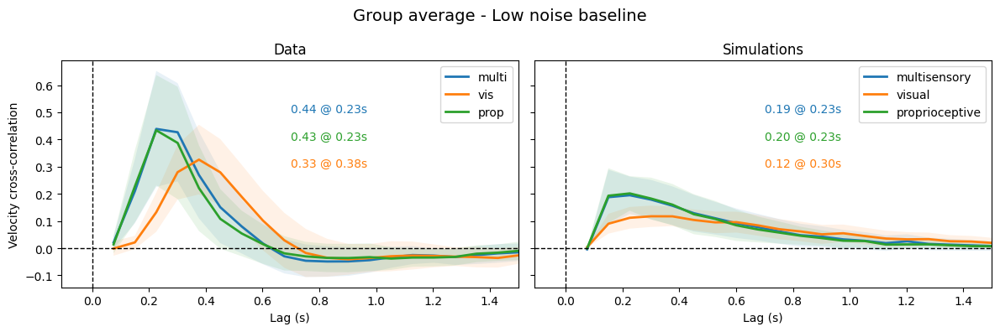

In [12]:
# -------------------------
    # Create group average figure
    # -------------------------
    # take each participant´s average curve for each condition and average across them
f, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)

    # Left panel: group data
data_offsets = {"multi": 0, "vis": -0.2, "prop": -0.1}

for condition in condition_order:
    # Stack into 3D array: participants x time x lags
    all_corrs = np.stack(participant_correls_actual_low[condition], axis=0)
    
    # Z-transformed values across participants
    z_corrs = jnp.arctanh(jnp.clip(all_corrs, -0.9999, 0.9999))
    z_mean = z_corrs.mean(axis=0)
    z_std = z_corrs.std(axis=0)
    mean_corr = jnp.tanh(z_mean)
    std_corr = jnp.tanh(z_std)

    #ax[0].plot(lags_actual[51:] * dt, mean_corr[51:], label=condition, lw=2)
    line = ax[0].plot(lags_actual[51:] * dt, mean_corr[51:], label=condition, lw=2)[0] 
    ax[0].fill_between(lags_actual[51:] * dt, mean_corr[51:] - std_corr[51:], 
                       mean_corr[51:] + std_corr[51:], alpha=0.1)
    
    # find peak correlation + lag to annotate
    peak_idx = jnp.argmax(mean_corr[51:])
    peak_value = mean_corr[51:][peak_idx]
    peak_lag = lags_actual[51:][peak_idx] * dt

    y_offset = data_offsets[condition]
    ax[0].annotate(f"{peak_value:.2f} @ {peak_lag:.2f}s",
                   xy=(peak_lag, peak_value),
                   xytext=(annotation_x, 0.5 + y_offset),
                   color=line.get_color(),
                   fontsize=10)

ax[0].set_title("Data")
ax[0].set_xlabel("Lag (s)")
ax[0].set_ylabel("Velocity cross-correlation")
ax[0].set_xlim(right=1.5)
ax[0].legend()
ax[0].axvline(0, color='k', ls='--', lw=1)
ax[0].axhline(0, color='k', ls='--', lw=1)

    # Right panel: model simulations group average
sim_offsets = {"multisensory": 0, "proprioceptive": -0.1, "visual": -0.2}
for name in ["multisensory", "visual", "proprioceptive"]:
    all_sim_corrs = np.stack(participant_correls_sim_low[name], axis=0)
    
    # Z-transformed values across participants
    z_sim = jnp.arctanh(jnp.clip(all_sim_corrs, -0.9999, 0.9999))
    z_sim_mean = z_sim.mean(axis=0)
    z_sim_std = z_sim.std(axis=0)

    mean_sim= jnp.tanh(z_sim_mean)
    std_sim= jnp.tanh(z_sim_std)
    
    line = ax[1].plot(lags_sim[51:] * dt, mean_sim[51:], label=name, lw=2)[0] 
    ax[1].fill_between(lags_sim[51:] * dt, mean_sim[51:] - std_sim[51:], 
                       mean_sim[51:] + std_sim[51:], alpha=0.1)
    
    # --- Find peak correlation and lag ---
    peak_idx = jnp.argmax(mean_sim[51:])
    peak_value = mean_sim[51:][peak_idx]
    peak_lag = lags_sim[51:][peak_idx] * dt

    y_offset = sim_offsets[name]
    ax[1].annotate(f"{peak_value:.2f} @ {peak_lag:.2f}s",
                   xy=(peak_lag, peak_value),
                   xytext=(annotation_x, 0.5 + y_offset),
                   color=line.get_color(),
                   fontsize=10)

ax[1].set_title("Simulations")
ax[1].set_xlabel("Lag (s)")
ax[1].set_xlim(right=1.5)
ax[1].legend()
ax[1].axvline(0, color='k', ls='--', lw=1)
ax[1].axhline(0, color='k', ls='--', lw=1)

plt.suptitle(f"Group average - Low noise baseline", fontsize=14)
plt.tight_layout()
plt.show()

### Simulate multisensory + unisensory data under high visual uncertainty

#### Participant-level

Processing participant: 135033060


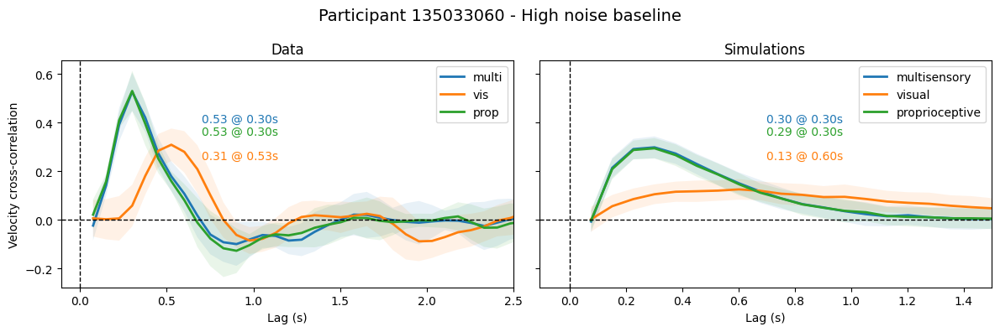

Processing participant: 173058413


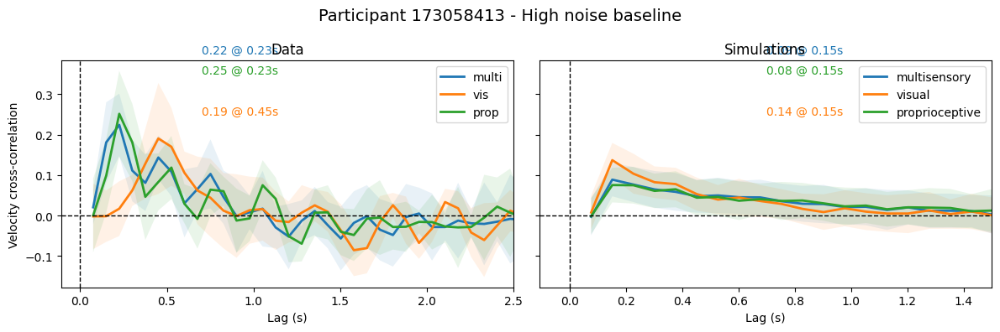

Processing participant: 177196795


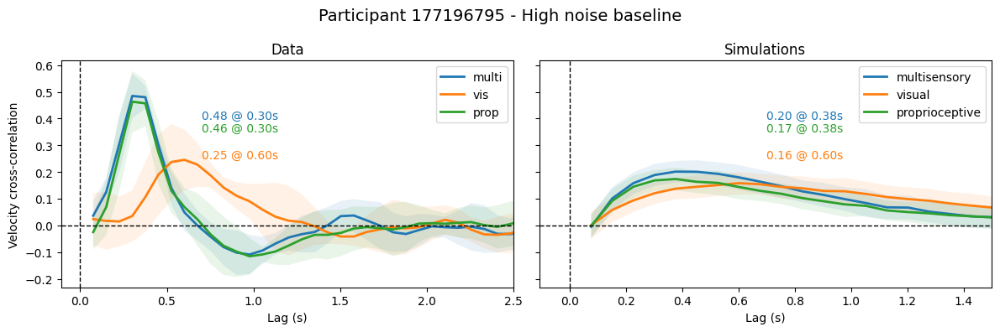

Processing participant: 182095555


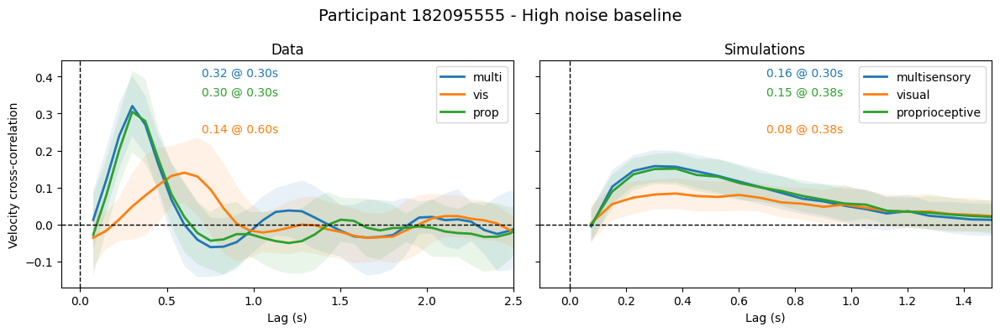

Processing participant: 212056115


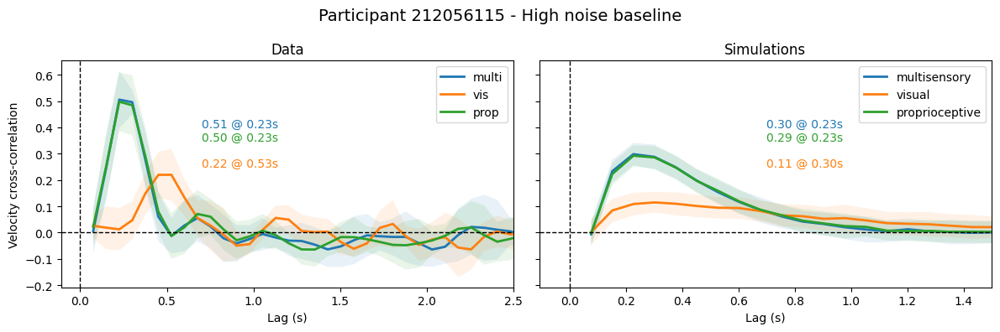

Processing participant: 330954011


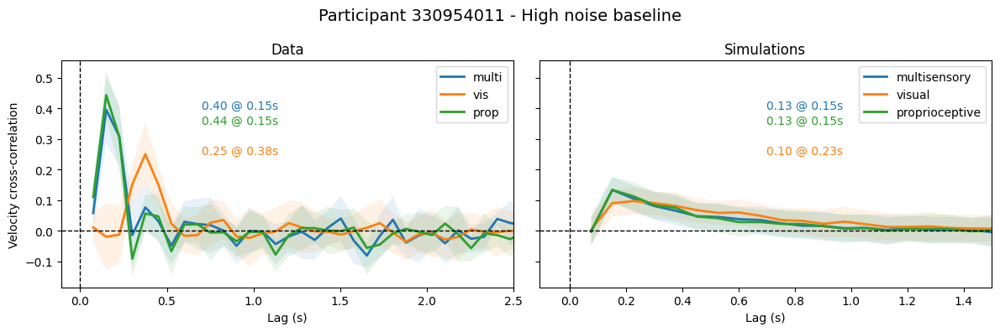

Processing participant: 524048600


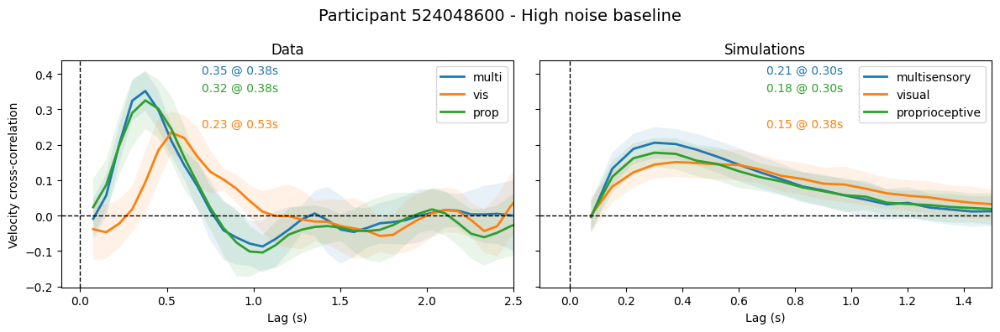

Processing participant: 544725341


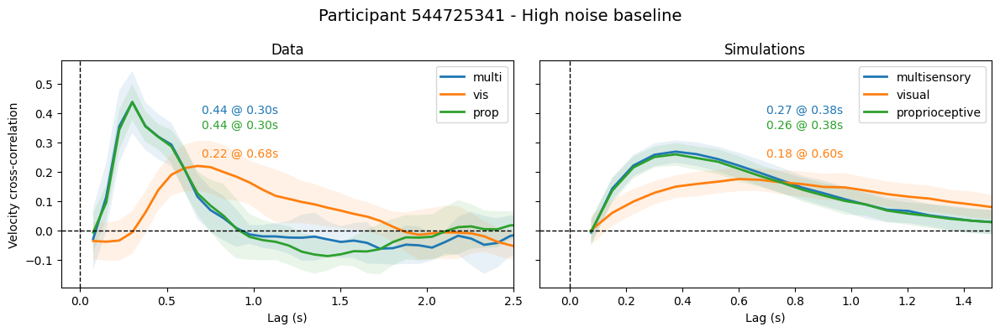

Processing participant: 644801403


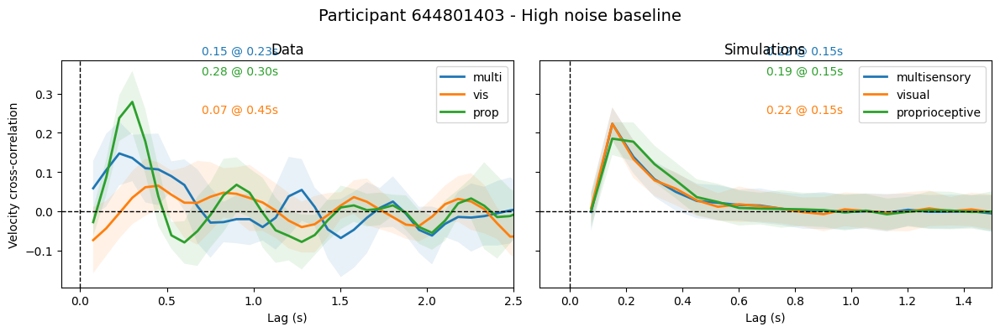

Processing participant: 657093471


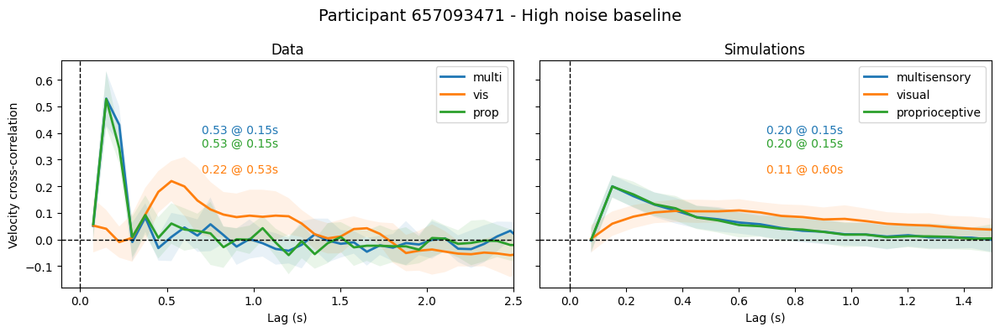

Processing participant: 714671738


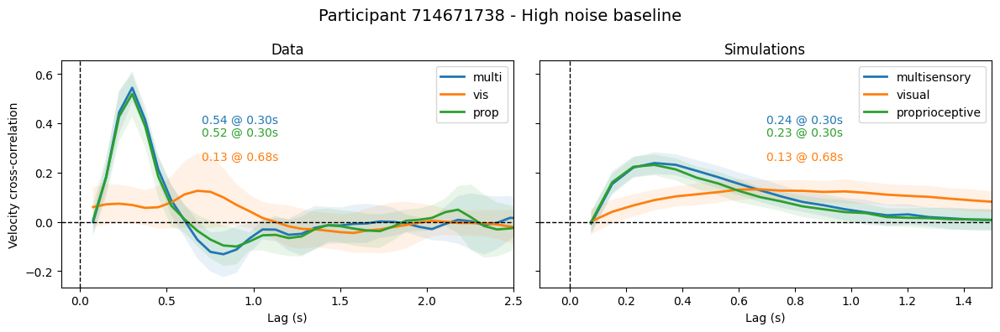

Processing participant: 741917610


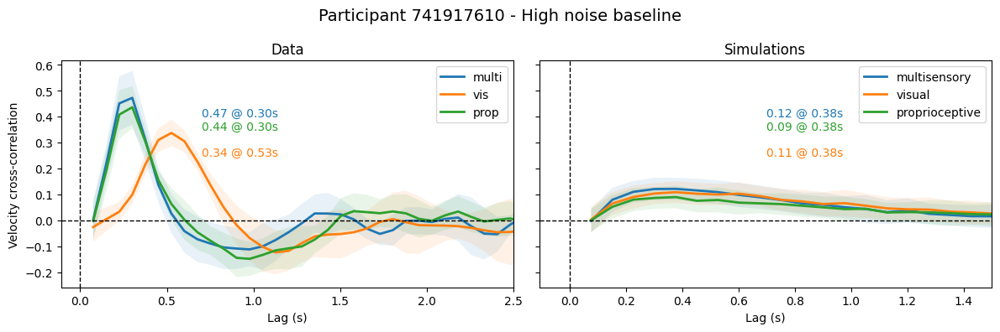

Processing participant: 765738475


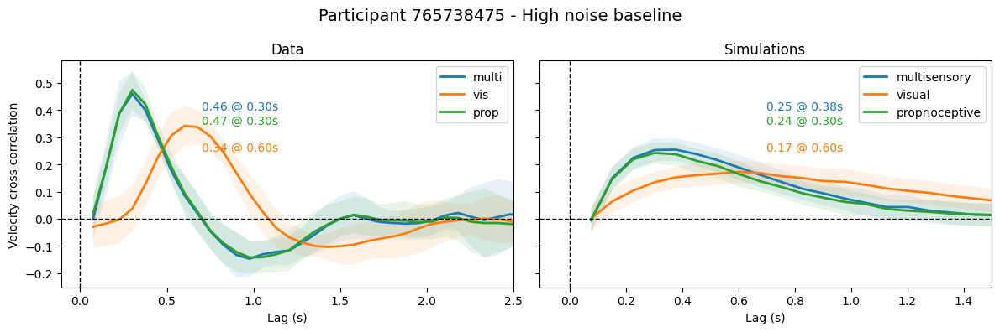

Processing participant: 799755310


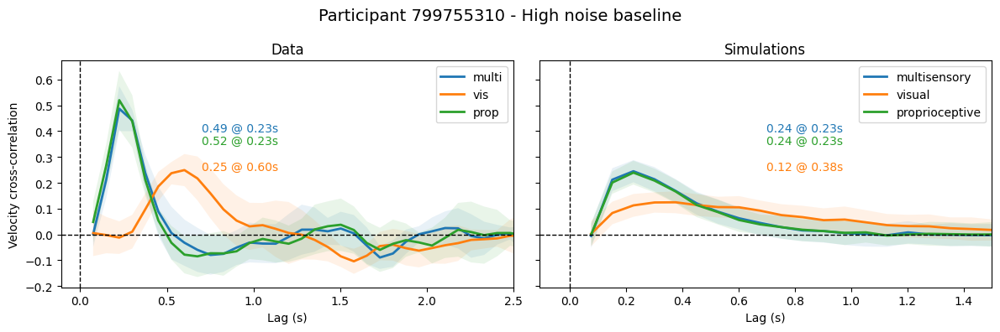

Processing participant: 802096684


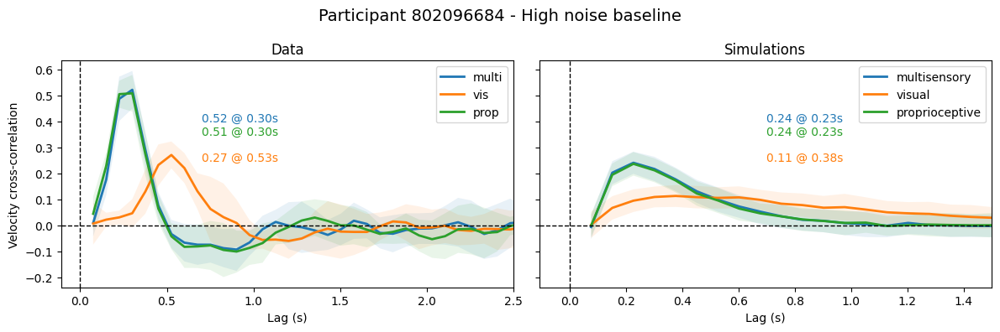

Processing participant: 879521247


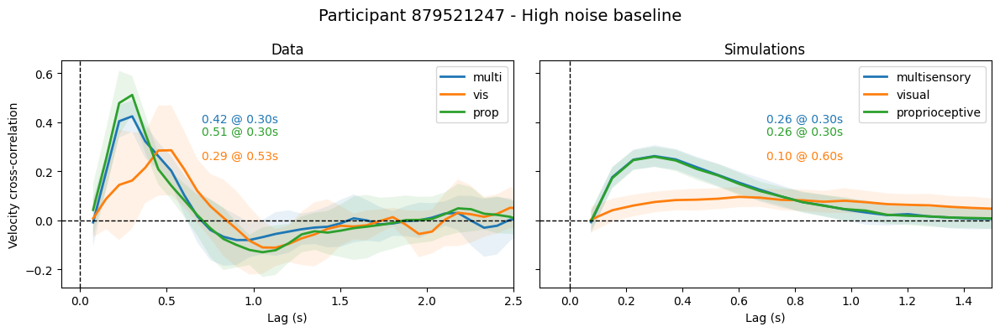

Processing participant: 891444214


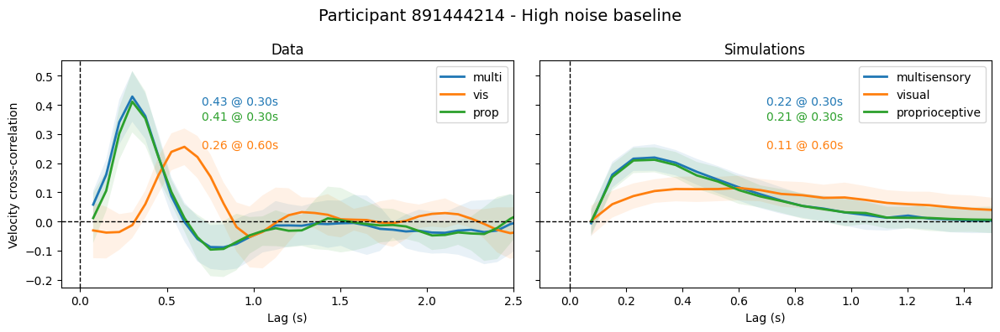

Processing participant: 910949717


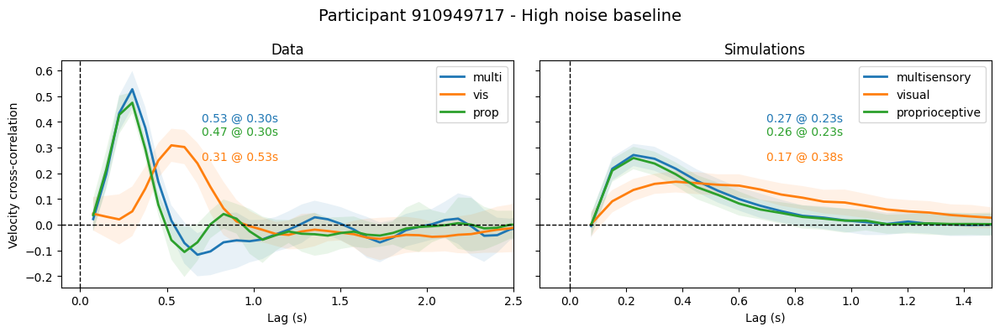

Processing participant: 918338248


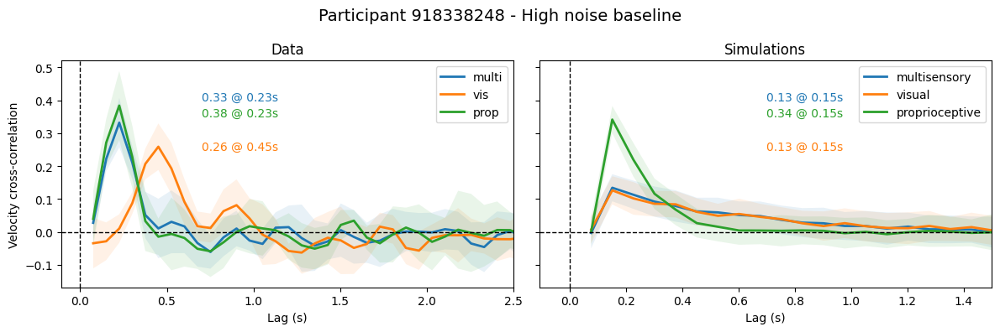

In [13]:
df_summary = pd.read_csv('/Users/pamelavillavicencio/Dropbox/Academic/phd/01_experiments/03_cont_psyphys/01_exp/03_python/01_modelling/results/summary/unisensory_baseline_summary.csv')
df_data = pd.read_csv("data/df_all_downsampled.csv")

participants = df_summary['participant_id'].unique()
dt = 1 / 13.3

# Storage for group-level averaging
participant_correls_actual_high = {cond: [] for cond in ["multi", "vis", "prop"]}
participant_correls_sim_high = {name: [] for name in ["multisensory", "visual", "proprioceptive"]}
lags_actual = None
lags_sim = None

condition_order = ["multi", "vis", "prop"]
condition_labels = {
    "multi": "multisensory",
    "vis": "visual",
    "prop": "proprioceptive"
}

for participant in participants:
    print(f"Processing participant: {participant}")
    
    # -------------------------
    # Get high-noise parameters from models
    # -------------------------
    prop_high = df_summary[(df_summary['participant_id'] == participant) & 
                          (df_summary['modality'] == 'prop') & (df_summary['vis_noise'] == 2)].iloc[0]
    vis_high = df_summary[(df_summary['participant_id'] == participant) & 
                         (df_summary['modality'] == 'vis') & (df_summary['vis_noise'] == 2)].iloc[0]
    
    action_variability_vis= ((prop_high["sigma"]**2)/ (prop_high["sigma"]**2 + vis_high["sigma"]**2)) * vis_high["action_variability"]
    action_variability_prop= ((vis_high["sigma"]**2)/ (vis_high["sigma"]**2 + prop_high["sigma"]**2)) * prop_high["action_variability"]
    action_variability= action_variability_vis + action_variability_prop 

    action_cost_vis= ((prop_high["sigma"]**2)/ (prop_high["sigma"]**2 + vis_high["sigma"]**2)) * vis_high["action_cost"]
    action_cost_prop= ((vis_high["sigma"]**2)/ (vis_high["sigma"]**2 + prop_high["sigma"]**2)) * prop_high["action_cost"]
    action_cost= action_cost_vis + action_cost_prop
    
    W_proprioceptive = jnp.diag(jnp.array([prop_high["sigma"]]))
    W_visual = jnp.diag(jnp.array([vis_high["sigma"]]))
    
    delay_proprioceptive = 1
    delay_visual = 1
    
    A = jnp.eye(2) # system dynamics
    B = dt * jnp.array([[0.0], [1.0]]) # control input
    F = jnp.array([[1., -1.]]) # observation
    #V = jnp.diag(jnp.array([1, ((prop_high["action_variability"] + vis_high["action_variability"]) / 2)])) # average action variability (process noise)
    V =jnp.diag(jnp.array([1, action_variability])) # weighted action variability
    V_vis = jnp.diag(jnp.array([1, vis_high["action_variability"]])) # visual-only action variability
    V_prop = jnp.diag(jnp.array([1, prop_high["action_variability"]])) # proprioceptive-only action variability
    Q = jnp.array([[1., -1.], [-1., 1.]]) # state cost
    R = jnp.array([[action_cost]])   # combined action cost
    R_vis = jnp.array([[vis_high["action_cost"]]]) # vis action cost
    R_prop = jnp.array([[prop_high["action_cost"]]]) # prop action cost

    spec_multisensory = multisensory_delay_system(
        A, B, V, [F, F], [W_proprioceptive, W_visual], Q, R,
        delays=[delay_proprioceptive, delay_visual], T=500
    )
    spec_visual = multisensory_delay_system(A, B, V_vis, [F], [W_visual], Q, R_vis, delays=[delay_visual], T=500)
    spec_proprioceptive = multisensory_delay_system(A, B, V_prop, [F], [W_proprioceptive], Q, R_prop, delays=[delay_proprioceptive], T=500)
    
    models = {
        "multisensory": System(actor=spec_multisensory, dynamics=spec_multisensory),
        "visual": System(actor=spec_visual, dynamics=spec_visual),
        "proprioceptive": System(actor=spec_proprioceptive, dynamics=spec_proprioceptive),
    }
    
    # -------------------------
    # Create individual participant figures
    # -------------------------
    f, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
    data_offsets = {"multi": 0, "vis": -0.15, "prop": -0.05}
    sim_offsets = {"multisensory": 0, "visual": -0.15, "proprioceptive": -0.05}
    # Left panel: actual data
    for condition in condition_order:
        data_actual = prep_data(df_data, participant=participant, condition=condition, vis_noise=2, phase="pre_cal")
        vels_actual = np.diff(data_actual, axis=1)
        lags_actual, correls_actual = xcorr(vels_actual[:, :, 1], vels_actual[:, :, 0], maxlags=50)
        
        # fisher-z transformation for actual data
        z_corrs = jnp.arctanh(jnp.clip(correls_actual, -0.9999, 0.9999))
        z_mean= z_corrs.mean(axis=0)
        z_std = z_corrs.std(axis=0)
        mean_corr = jnp.tanh(z_mean)
        std_corr = jnp.tanh(z_std)

        # store z-transformed mean for group averaging
        participant_correls_actual_high[condition].append(z_mean)

        # plot individual participant data
        line = ax[0].plot(lags_actual[51:] * dt, mean_corr[51:], label=condition, lw=2)[0] ##
        #ax[0].plot(lags_actual[51:] * dt, mean_corr[51:], label=condition, lw=2)
        ax[0].fill_between(lags_actual[51:] * dt, mean_corr[51:] - std_corr[51:], 
                           mean_corr[51:] + std_corr[51:], alpha=0.1)
        
        # --- Find peak correlation and lag ---
        peak_idx = jnp.argmax(mean_corr[51:])
        peak_value = mean_corr[51:][peak_idx]
        peak_lag = lags_actual[51:][peak_idx] * dt

        y_offset = data_offsets[condition]
        ax[0].annotate(f"{peak_value:.2f} @ {peak_lag:.2f}s",
                   xy=(peak_lag, peak_value),
                   xytext=(annotation_x, 0.4 + y_offset),
                   color=line.get_color(),
                   fontsize=10)
    
    ax[0].set_title("Data")
    ax[0].set_xlabel("Lag (s)")
    ax[0].set_ylabel("Velocity cross-correlation")
    ax[0].set_xlim(right=2.5)
    ax[0].legend()
    ax[0].axvline(0, color='k', ls='--', lw=1)
    ax[0].axhline(0, color='k', ls='--', lw=1)
    
    # Right panel: model simulations
    key = random.PRNGKey(12398)
    for name, model in models.items():
        key, subkey = random.split(key)
        x_sim = model.simulate(rng_key=subkey, n=100)
        # for each time step:
            # compute delayed, noisy observations for each modality
            # combine multisensory observations to estimate current state
            # compute optimal control action (balance state cost and control cost)
            # add action variability
            # update state based on dynamics
            # repeat for all trials
        vels_sim = jnp.diff(x_sim, axis=-2)
        lags_sim, correls_sim = xcorr(vels_sim[..., 1], vels_sim[..., 0], maxlags=50)
        
        # fisher-z transformation for simulated data
        z_sim = jnp.arctanh(jnp.clip(correls_sim, -0.9999, 0.9999))
        z_sim_mean= z_sim.mean(axis=0)
        z_sim_std = z_sim.std(axis=0)
        mean_sim = jnp.tanh(z_sim_mean)
        std_sim = jnp.tanh(z_sim_std)

        # Store Z-transformed mean for group averaging
        participant_correls_sim_high[name].append(z_sim_mean)
        
        # plot individual participant model data
        line = ax[1].plot(lags_sim[51:] * dt, mean_sim[51:], label=name, lw=2)[0] ##
        #ax[1].plot(lags_sim[51:] * dt, mean_sim[51:], label=name, lw=2)
        ax[1].fill_between(lags_sim[51:] * dt, mean_sim[51:] - std_sim[51:], 
                           mean_sim[51:] + std_sim[51:], alpha=0.1)
        
        # --- Find peak correlation and lag ---
        peak_idx = jnp.argmax(mean_sim[51:])
        peak_value = mean_sim[51:][peak_idx]
        peak_lag = lags_sim[51:][peak_idx] * dt

        y_offset = sim_offsets[name]
        ax[1].annotate(f"{peak_value:.2f} @ {peak_lag:.2f}s",
                   xy=(peak_lag, peak_value),
                   xytext=(annotation_x, 0.4 + y_offset),
                   color=line.get_color(),
                   fontsize=10)

    ax[1].set_title("Simulations")
    ax[1].set_xlabel("Lag (s)")
    ax[1].set_xlim(right=1.5)
    ax[1].legend()
    ax[1].axvline(0, color='k', ls='--', lw=1)
    ax[1].axhline(0, color='k', ls='--', lw=1)
    
    plt.suptitle(f"Participant {participant} - High noise baseline", fontsize=14)
    plt.tight_layout()
    plt.show()

#### Group-level

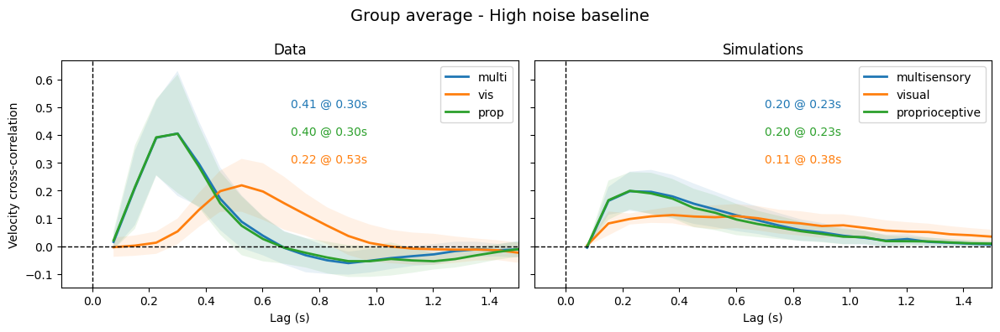

In [14]:
# -------------------------
    # Create group average figure
    # -------------------------
    # take each participant´s average curve for each condition and average across them
f, ax = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
data_offsets = {"multi": 0, "vis": -0.2, "prop": -0.1}

    # Left panel: group data
for condition in condition_order:
    # Stack into 3D array: participants x time x lags
    all_corrs = np.stack(participant_correls_actual_high[condition], axis=0)
    
    # Z-transformed values across participants
    z_corrs = jnp.arctanh(jnp.clip(all_corrs, -0.9999, 0.9999))
    z_mean = z_corrs.mean(axis=0)
    z_std = z_corrs.std(axis=0)
    mean_corr = jnp.tanh(z_mean)
    std_corr = jnp.tanh(z_std)

    line = ax[0].plot(lags_actual[51:] * dt, mean_corr[51:], label=condition, lw=2)[0] ##
    ax[0].fill_between(lags_actual[51:] * dt, mean_corr[51:] - std_corr[51:], 
                       mean_corr[51:] + std_corr[51:], alpha=0.1)

    peak_idx = jnp.argmax(mean_corr[51:])
    peak_value = mean_corr[51:][peak_idx]
    peak_lag = lags_actual[51:][peak_idx] * dt

    y_offset = data_offsets[condition]
    ax[0].annotate(f"{peak_value:.2f} @ {peak_lag:.2f}s",
                   xy=(peak_lag, peak_value),
                   xytext=(annotation_x, 0.5 + y_offset),
                   color=line.get_color(),
                   fontsize=10)
    
ax[0].set_title("Data")
ax[0].set_xlabel("Lag (s)")
ax[0].set_ylabel("Velocity cross-correlation")
ax[0].set_xlim(right=1.5)
ax[0].legend()
ax[0].axvline(0, color='k', ls='--', lw=1)
ax[0].axhline(0, color='k', ls='--', lw=1)

    # Right panel: model simulations group average
sim_offsets = {"multisensory": 0, "proprioceptive": -0.1, "visual": -0.2}
for name in ["multisensory", "visual", "proprioceptive"]:
    all_sim_corrs = np.stack(participant_correls_sim_high[name], axis=0)
    
    # Z-transformed values across participants
    z_sim = jnp.arctanh(jnp.clip(all_sim_corrs, -0.9999, 0.9999))
    z_sim_mean = z_sim.mean(axis=0)
    z_sim_std = z_sim.std(axis=0)

    mean_sim= jnp.tanh(z_sim_mean)
    std_sim= jnp.tanh(z_sim_std)
    
    #ax[1].plot(lags_sim[51:] * dt, mean_sim[51:], label=name, lw=2)
    line = ax[1].plot(lags_sim[51:] * dt, mean_sim[51:], label=name, lw=2)[0] ##
    ax[1].fill_between(lags_sim[51:] * dt, mean_sim[51:] - std_sim[51:], 
                       mean_sim[51:] + std_sim[51:], alpha=0.1)

# --- Find peak correlation and lag ---
    peak_idx = jnp.argmax(mean_sim[51:])
    peak_value = mean_sim[51:][peak_idx]
    peak_lag = lags_sim[51:][peak_idx] * dt

    y_offset = sim_offsets[name]
    ax[1].annotate(f"{peak_value:.2f} @ {peak_lag:.2f}s",
                   xy=(peak_lag, peak_value),
                   xytext=(annotation_x, 0.5 + y_offset),
                   color=line.get_color(),
                   fontsize=10)
    
ax[1].set_title("Simulations")
ax[1].set_xlabel("Lag (s)")
ax[1].set_xlim(right=1.5)
ax[1].legend()
ax[1].axvline(0, color='k', ls='--', lw=1)
ax[1].axhline(0, color='k', ls='--', lw=1)

plt.suptitle(f"Group average - High noise baseline", fontsize=14)
plt.tight_layout()
plt.show()

## Bias

Create a function to simulate group or participant-level data

In [53]:
# Load actual data and filter for backward perturbation participants only
df_err = pd.read_csv('/Users/pamelavillavicencio/Dropbox/Academic/phd/01_experiments/03_cont_psyphys/01_exp/01_rproject/01_analyses/data/4_r_dataframes/modelling_df/all_participants/df_err.csv')
df_bias = df_err[(df_err["perturb"]== "Backward") & (df_err["type"]=="multi")] #keep only participants with Backward perturbation + multi trials

dt = 1 / 13.3
random_walk_std = 1.0 #process noise
delay_proprioceptive = 1
delay_visual = 1
bias_values = jnp.arange(0.0, 5.5, 0.5)
key = random.PRNGKey(12398)
participants = df_bias["participant"].unique()

# ----------------------------
# Compute perceptual uncertainty
# -----------------------------
vis_low_avg = df_summary[(df_summary["modality"] == "vis") & (df_summary["vis_noise"] == 1)]
vis_high_avg = df_summary[(df_summary["modality"] == "vis") & (df_summary["vis_noise"] == 2)]
prop_low_avg = df_summary[(df_summary["modality"] == "prop") & (df_summary["vis_noise"] == 1)]
prop_high_avg = df_summary[(df_summary["modality"] == "prop") & (df_summary["vis_noise"] == 2)]

perceptual_uncertainty = { # this is then passed as sigma_vis to the model
    "low": vis_low_avg["sigma"].mean(),
    "high": vis_high_avg["sigma"].mean()
}

prop_uncertainty = { # this is then passed as sigma_prop to the model
    "low": prop_low_avg["sigma"].mean(),
    "high": prop_high_avg["sigma"].mean()
}

# -----------------------------
# Group-level reliability-weighted action cost and variability
# -----------------------------
motor_params_group = {}
for level, vis_noise in {"low": 1, "high": 2}.items():
    action_vars = []
    action_costs = []
    for participant in participants:
        prop = df_summary[
            (df_summary["participant_id"] == participant) &
            (df_summary["modality"] == "prop") &
            (df_summary["vis_noise"] == vis_noise)
        ].iloc[0]

        vis = df_summary[
            (df_summary["participant_id"] == participant) &
            (df_summary["modality"] == "vis") &
            (df_summary["vis_noise"] == vis_noise)
        ].iloc[0]

        w_vis = prop["sigma"]**2 / (prop["sigma"]**2 + vis["sigma"]**2)
        w_prop = vis["sigma"]**2 / (prop["sigma"]**2 + vis["sigma"]**2)

        action_vars.append(w_vis * vis["action_variability"] + w_prop * prop["action_variability"])
        action_costs.append(w_vis * vis["action_cost"] + w_prop * prop["action_cost"])

    motor_params_group[level] = {
        "action_variability": np.mean(action_vars),
        "action_cost": np.mean(action_costs)
    }

# -----------------------------
# Model matrices
# -----------------------------
# Model with bias term

A = jnp.eye(3)
B = dt * jnp.array([[0.0], [1.0], [0.0]])
Fs = [jnp.array([[1., -1., 0.]]), jnp.array([[0., -1., 1.]])]
Q = jnp.array([[1., -1., 0.], [-1., 1., 0.], [0., 0., 0.]])

# Internal model that does not know about the bias
A_subj = jnp.eye(2)
B_subj = dt * jnp.array([[0.0], [1.0]])
Fs_subj = [jnp.array([[1., -1.]]), jnp.array([[1., -1.]])]
Q_subj = jnp.array([[1., -1.], [-1., 1.]])

W_proprioceptive = jnp.diag(jnp.array([1.]))
W_visual = jnp.diag(jnp.array([1.]))

# -----------------------------
# Function to simulate participant or group
# -----------------------------
def simulate_model(key, action_var, action_cost, sigma_prop, sigma_vis):
    V = jnp.array([[random_walk_std, 0., 0.],
                   [0., action_var, 0.],
                   [1., 0., 0.]])
    R = jnp.array([[action_cost]])
    V_subj = jnp.array([[random_walk_std, 0.],
                        [0., action_var]])
    R_subj = jnp.array([[action_cost]])

    dynamics = multisensory_delay_system(A, B, V, Fs,
                                         [sigma_prop * W_proprioceptive, sigma_vis * W_visual], 
                                         Q, R,
                                         delays=[delay_proprioceptive, delay_visual],
                                         T=1000)
    actor = multisensory_delay_system(A_subj, B_subj, V_subj, Fs_subj,
                                      [sigma_prop * W_proprioceptive, sigma_vis * W_visual],
                                      Q_subj, R_subj,
                                      delays=[delay_proprioceptive, delay_visual],
                                      T=1000)
    model = System(dynamics=dynamics, actor=actor)

    errors = []
    for bias in bias_values:
        key, subkey = random.split(key)
        x = model.simulate(rng_key=subkey, n=100, x0=jnp.array([0., 0., bias] + [0.] * 3)) #change to 6 if we change delays to 2
        errors.append(jnp.mean(x[..., 1] - x[..., 0]))
    return jnp.array(errors), key

#### Group-level plots

(-1.0, 4.0)

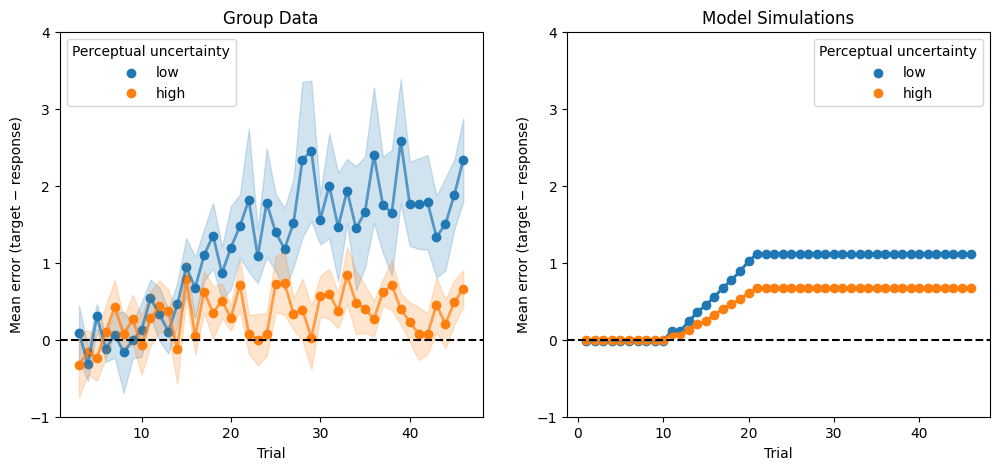

In [62]:
# -----------------------------
# Group average side-by-side plot
# -----------------------------
fig, axs = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns

for i, level in enumerate(["low", "high"]):
    data_level = df_bias[df_bias["vis_noise"] == (1 if level=="low" else 2)]
    
    # Compute mean and SEM per trial number
    stats = data_level.groupby("cycle")["err"].agg(['mean','sem']).reset_index()
    
    x_vals = stats["cycle"]   
    y_vals = stats["mean"]
    y_err = stats["sem"]
    
    # Ribbon (mean ± SEM)
    axs[0].fill_between(x_vals, y_vals - y_err, y_vals + y_err, color=f"C{i}", alpha=0.2)
    
    # Mean line and scatter
    axs[0].plot(x_vals, y_vals, color=f"C{i}", alpha=0.7, lw=2)
    axs[0].scatter(x_vals, y_vals, color=f"C{i}", label=f"{level}")

axs[0].axhline(0, color="black", linestyle="--")
axs[0].set_xlabel("Trial")
axs[0].set_ylabel("Mean error (target − response)")
axs[0].set_title("Group Data")
axs[0].legend(title="Perceptual uncertainty")
axs[0].set_ylim(-1, 4.0)

# Right: model simulation
# Prepare lists to store participant simulations
sim_matrix_low = []
sim_matrix_high = []

for participant in participants:  # only participants you want
    for level in ["low", "high"]:
        # Compute participant-specific action_var_ind and action_cost_ind
        prop = df_summary[
            (df_summary["participant_id"] == participant) &
            (df_summary["modality"] == "prop") &
            (df_summary["vis_noise"] == (1 if level=="low" else 2))
        ].iloc[0]
        vis = df_summary[
            (df_summary["participant_id"] == participant) &
            (df_summary["modality"] == "vis") &
            (df_summary["vis_noise"] == (1 if level=="low" else 2))
        ].iloc[0]

        w_vis = prop["sigma"]**2 / (prop["sigma"]**2 + vis["sigma"]**2)
        w_prop = vis["sigma"]**2 / (prop["sigma"]**2 + vis["sigma"]**2)

        action_var_ind = w_vis * vis["action_variability"] + w_prop * prop["action_variability"]
        action_cost_ind = w_vis * vis["action_cost"] + w_prop * prop["action_cost"]

        # Run model simulation for this participant
        errors_ind, key = simulate_model(key, action_var_ind, action_cost_ind,
                                         prop_uncertainty[level], perceptual_uncertainty[level])

        # Append to the appropriate list
        if level == "low":
            sim_matrix_low.append(errors_ind)
        else:
            sim_matrix_high.append(errors_ind)

# Convert to numpy arrays: shape = (num_participants, num_bias_values)
sim_matrix_low = np.array(sim_matrix_low)
sim_matrix_high = np.array(sim_matrix_high)

# Compute mean and SEM across participants (axis=0 = bias values)
mean_sim_low = sim_matrix_low.mean(axis=0)
sem_sim_low = sim_matrix_low.std(axis=0) / np.sqrt(sim_matrix_low.shape[0])

mean_sim_high = sim_matrix_high.mean(axis=0)
sem_sim_high = sim_matrix_high.std(axis=0) / np.sqrt(sim_matrix_high.shape[0])


# Map bias_values to cycle axis
x_sim = np.arange(1, 47)  # x = 1 to 46
n_bias = len(mean_sim_low)
mean_idx = np.zeros_like(x_sim, dtype=int) # initialize index array
mean_idx[0:10] = 0 # x = 1-10 -> bias = 0 (index 0)
mean_idx[10:20] =np.linspace(1, n_bias-2, 10, dtype=int)
mean_idx[20:] = n_bias - 1

#low noise values
axs[1].plot(x_sim, mean_sim_low[mean_idx], color="C0", lw=2)
axs[1].fill_between(x_sim,
                    mean_sim_low[mean_idx] - sem_sim_low[mean_idx],
                    mean_sim_low[mean_idx] + sem_sim_low[mean_idx],
                    color="C0", alpha=0.2)
axs[1].scatter(x_sim, mean_sim_low[mean_idx], color="C0", label="low")  

# high noise values
axs[1].plot(x_sim, mean_sim_high[mean_idx], color="C1", lw=2)
axs[1].fill_between(x_sim,
                    mean_sim_high[mean_idx] - sem_sim_high[mean_idx],
                    mean_sim_high[mean_idx] + sem_sim_high[mean_idx],
                    color="C1", alpha=0.2)
axs[1].scatter(x_sim, mean_sim_high[mean_idx], color="C1", label="high")  

axs[1].axhline(0, color="black", linestyle="--")
axs[1].set_xlabel("Trial")
axs[1].set_ylabel("Mean error (target − response)")
axs[1].set_title("Model Simulations")
axs[1].legend(title="Perceptual uncertainty")
axs[1].set_ylim(-1, 4.0)

### Participant-level plots

Processing participant: 173058413


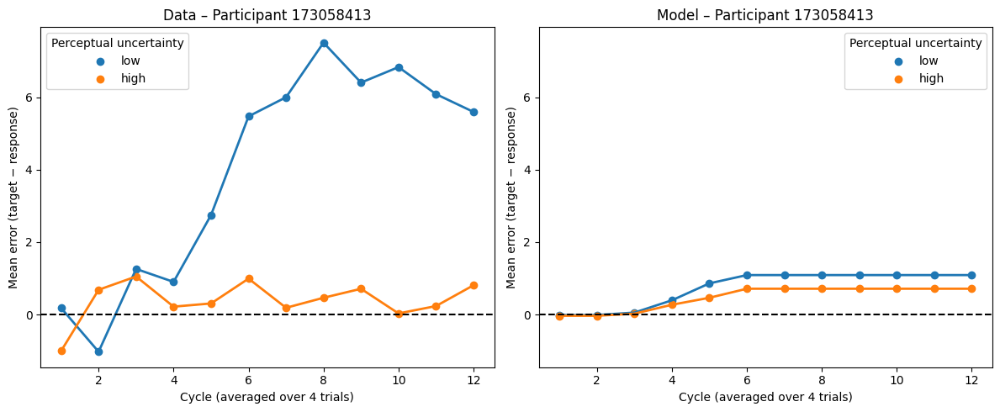

Processing participant: 177196795


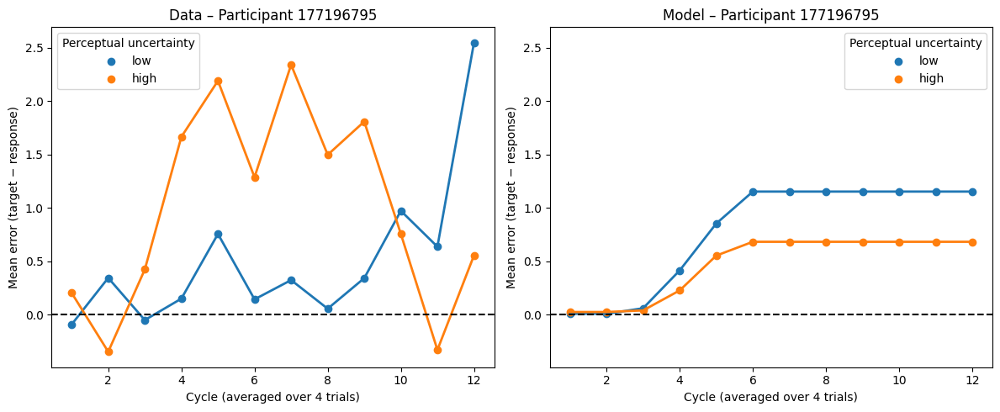

Processing participant: 182095555


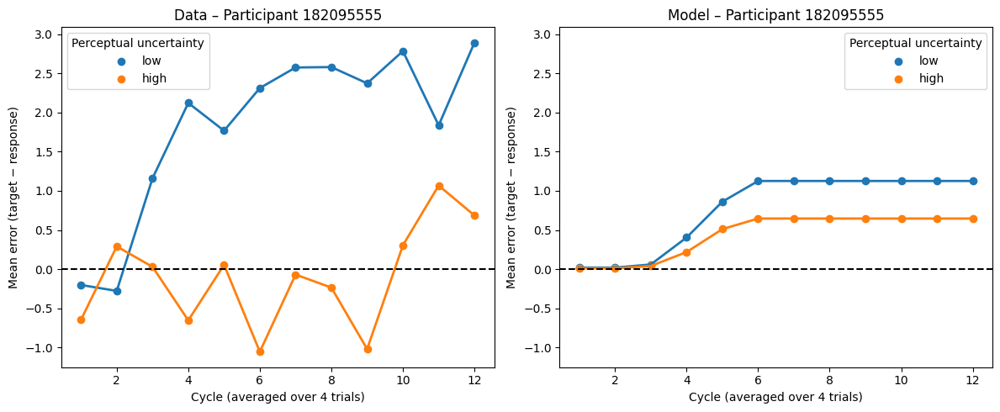

Processing participant: 212056115


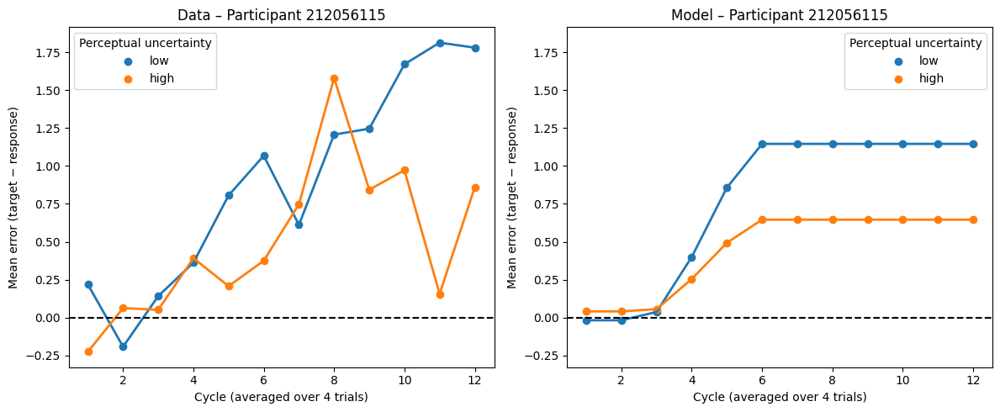

Processing participant: 524048600


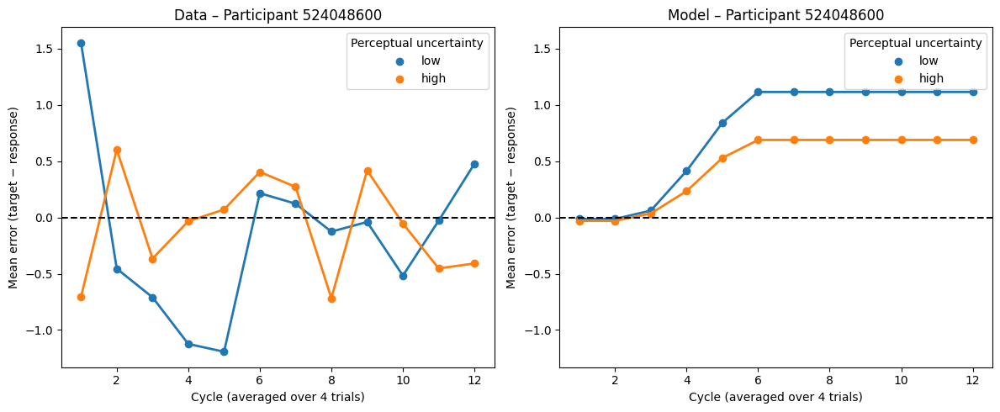

Processing participant: 741917610


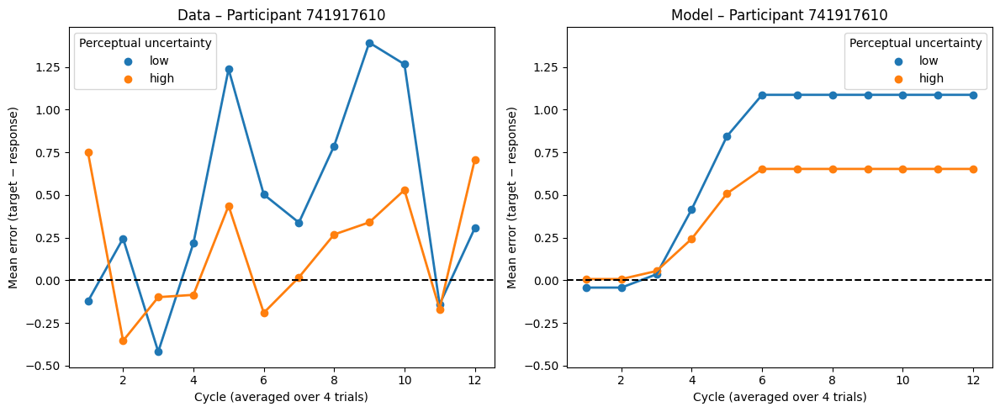

Processing participant: 765738475


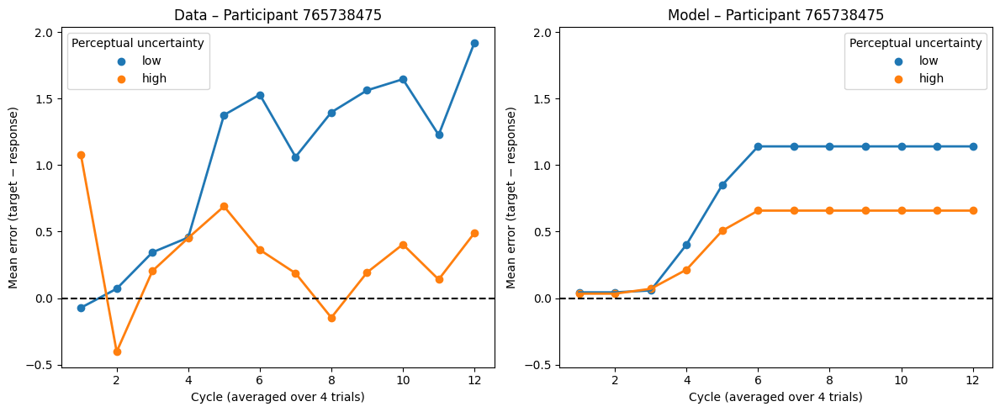

Processing participant: 802096684


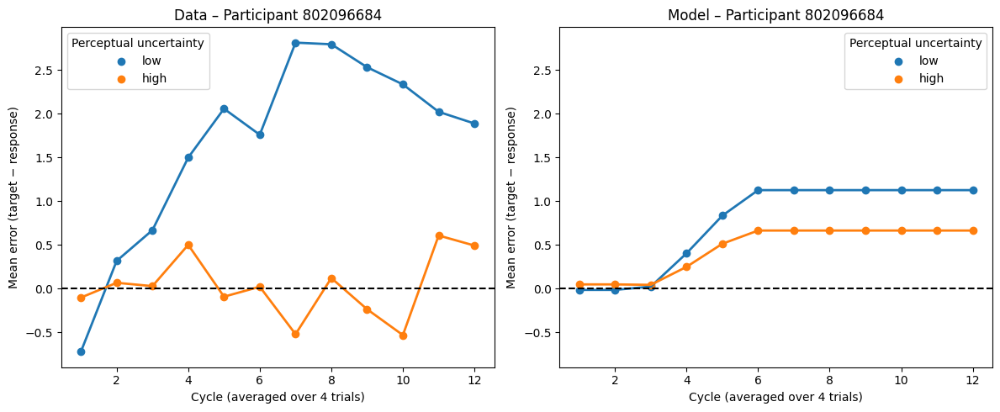

Processing participant: 879521247


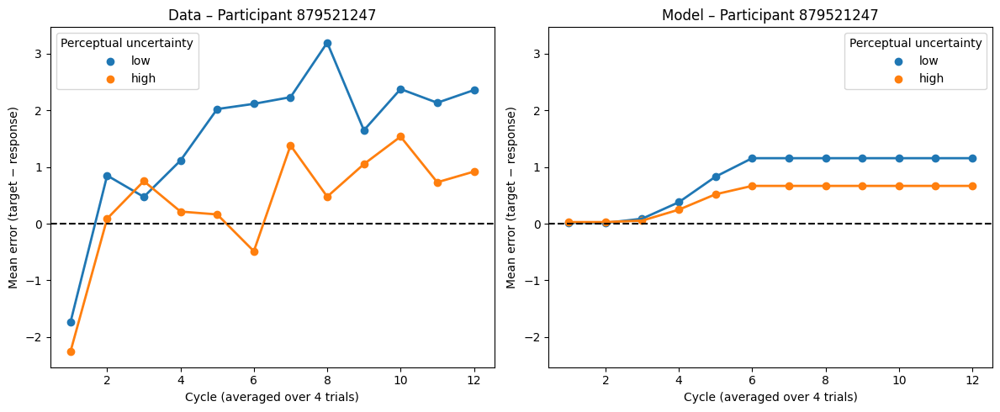

Processing participant: 918338248


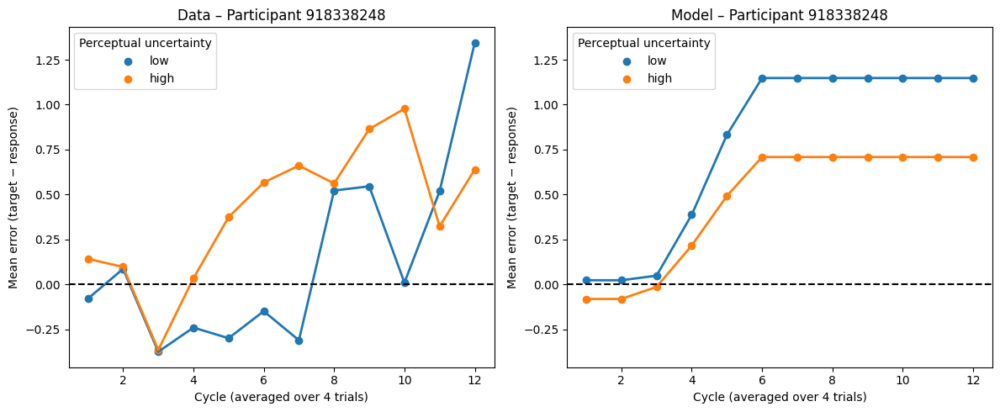

In [ ]:
for participant in participants:
    print(f"Processing participant: {participant}")
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))  
    
    for i, level in enumerate(["low", "high"]):
        # -----------------------------
        # LEFT PANEL: participant data
        # -----------------------------
        data_level = df_bias[(df_bias["participant"] == participant) & 
                             (df_bias["vis_noise"] == (1 if level=="low" else 2))]
        
        stats = data_level.groupby("cycle")["err"].agg(['mean','sem']).reset_index()
        
        x_vals = stats["cycle"].values
        y_vals = stats["mean"].values
        y_err  = stats["sem"].values
        
        # ---- average every 4 cycles ----
        bin_size = 4
        x_bins = np.arange(1, x_vals.max()+1, bin_size)        
        n_bins = len(x_bins)
        x_avg = np.arange(1, n_bins + 1)        
        
        y_avg = np.array([y_vals[(x_vals >= b) & (x_vals < b+bin_size)].mean()
                          for b in x_bins if np.any((x_vals >= b) & (x_vals < b+bin_size))])
        
        y_err_avg = np.array([y_err[(x_vals >= b) & (x_vals < b+bin_size)].mean()
                              for b in x_bins if np.any((x_vals >= b) & (x_vals < b+bin_size))])
        
        axs[0].plot(x_avg, y_avg, color=f"C{i}", lw=2)
        axs[0].fill_between(x_avg, y_avg - y_err_avg, y_avg + y_err_avg,
                            color=f"C{i}", alpha=0.2)
        axs[0].scatter(x_avg, y_avg, color=f"C{i}", label=f"{level}")
        
        # -----------------------------
        # RIGHT PANEL: participant model
        # -----------------------------
        prop = df_summary[(df_summary["participant_id"] == participant) &
                          (df_summary["modality"] == "prop") &
                          (df_summary["vis_noise"] == (1 if level=="low" else 2))].iloc[0]
        vis = df_summary[(df_summary["participant_id"] == participant) &
                         (df_summary["modality"] == "vis") &
                         (df_summary["vis_noise"] == (1 if level=="low" else 2))].iloc[0]

        w_vis = prop["sigma"]**2 / (prop["sigma"]**2 + vis["sigma"]**2)
        w_prop = vis["sigma"]**2 / (prop["sigma"]**2 + vis["sigma"]**2)

        action_var_ind  = w_vis * vis["action_variability"] + w_prop * prop["action_variability"]
        action_cost_ind = w_vis * vis["action_cost"] + w_prop * prop["action_cost"]

        errors_ind, key = simulate_model(
            key,
            action_var_ind,
            action_cost_ind,
            prop_uncertainty[level],
            perceptual_uncertainty[level]
        )
        
        # ---- map model to cycle axis ----
        n_bias = len(errors_ind)
        x_sim = np.arange(1, 47)

        mean_idx = np.zeros_like(x_sim, dtype=int)
        mean_idx[0:10]   = 0
        mean_idx[10:20]  = np.linspace(1, n_bias-2, 10, dtype=int)
        mean_idx[20:]    = n_bias - 1

        y_sim = errors_ind[mean_idx]

        # ---- average every 4 cycles (model) ----
        y_sim_avg = np.array([y_sim[(x_sim >= b) & (x_sim < b+bin_size)].mean()
                              for b in x_bins if np.any((x_sim >= b) & (x_sim < b+bin_size))])

        axs[1].plot(x_avg, y_sim_avg, color=f"C{i}", lw=2)
        axs[1].scatter(x_avg, y_sim_avg, color=f"C{i}", label=f"{level}")
    
    # -----------------------------
    # Formatting
    # -----------------------------
    for ax in axs:
        ax.axhline(0, color="black", linestyle="--")
        ax.set_xlabel("Cycle (averaged over 4 trials)")
        ax.set_ylabel("Mean error (target − response)")
        ax.legend(title="Perceptual uncertainty")

    axs[0].set_title(f"Data – Participant {participant}")
    axs[1].set_title(f"Model – Participant {participant}")

    # Match y-limits
    y_min = min(axs[0].get_ylim()[0], axs[1].get_ylim()[0])
    y_max = max(axs[0].get_ylim()[1], axs[1].get_ylim()[1])
    axs[0].set_ylim(y_min, y_max)
    axs[1].set_ylim(y_min, y_max)

    plt.tight_layout()
    plt.show()
